# <center> <font color='blue'> Data Mining the Water Table

### <center> April Itriago Trujillo

## 1. Problema e información de data:

#### 1.1 Informacion sobre el proyecto:

Using data from Taarifa and the Tanzanian Ministry of Water, can you predict which pumps are functional, which need some repairs, and which don't work at all?. Predict one of these three classes based on a number of variables about what kind of pump is operating, when it was installed, and how it is managed. A smart understanding of which waterpoints will fail can improve maintenance operations and ensure that clean, potable water is available to communities across Tanzania.

#### 1.2 Meta
Predict the operating condition of a waterpoint for each record in the dataset.

#### 1.3 Informacion sobre las variables:

- amount_tsh - Total static head (amount water available to waterpoint)
- date_recorded - The date the row was entered
- funder - Who funded the well
- gps_height - Altitude of the well
- installer - Organization that installed the well
- longitude - GPS coordinate
- latitude - GPS coordinate
- wpt_name - Name of the waterpoint if there is one
- num_private -
- basin - Geographic water basin
- subvillage - Geographic location
- region - Geographic location
- region_code - Geographic location (coded)
- district_code - Geographic location (coded)
- lga - Geographic location
- ward - Geographic location
- population - Population around the well
- public_meeting - True/False
- recorded_by - Group entering this row of data
- scheme_management - Who operates the waterpoint
- scheme_name - Who operates the waterpoint
- permit - If the waterpoint is permitted
- construction_year - Year the waterpoint was constructed
- extraction_type - The kind of extraction the waterpoint uses
- extraction_type_group - The kind of extraction the waterpoint uses
- extraction_type_class - The kind of extraction the waterpoint uses
- management - How the waterpoint is managed
- management_group - How the waterpoint is managed
- payment - What the water costs
- payment_type - What the water costs
- water_quality - The quality of the water
- quality_group - The quality of the water
- quantity - The quantity of water
- quantity_group - The quantity of water
- source - The source of the water
- source_type - The source of the water
- source_class - The source of the water
- waterpoint_type - The kind of waterpoint
- waterpoint_type_group - The kind of waterpoint

#### 1.4 Etiquetas

- functional - the waterpoint is operational and there are no repairs needed
- functional needs repair - the waterpoint is operational, but needs repairs
- non functional - the waterpoint is not operational

## 2. Librerías y data

#### 2.1 Importe de librerías

In [1]:
import pandas as pd
import numpy as np

from datetime import datetime
import requests
import seaborn as sns
sns.set()
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

import re

# IQR/Z score.
from scipy.stats import stats

# Seleción de variables.
from sklearn.feature_selection import SelectKBest

# Modelos Selección.
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, StratifiedKFold

# Modelos.
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
#from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeClassifierCV
from sklearn.svm import SVC
from sklearn.model_selection import RepeatedStratifiedKFold

# Preprocesado.
from sklearn.preprocessing import MinMaxScaler

from imblearn.over_sampling import SMOTE
import pickle
# Métricas.
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, auc, confusion_matrix, f1_score, precision_score, recall_score, roc_curve, classification_report

In [2]:
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 200)

#### 2.2 Importe de data

In [3]:
# Importamos los archivos.
train_labels = pd.read_csv('/Users/aprilm/Data_science/machine_learning/water_table/training_set_labels.csv')
train_data = pd.read_csv('/Users/aprilm/Data_science/machine_learning/water_table/training_set_values.csv', parse_dates=['date_recorded'])
test_data = pd.read_csv('/Users/aprilm/Data_science/machine_learning/water_table/test_set_values.csv', parse_dates=['date_recorded'])

In [4]:
#  Concatenamos training_data con training_labels.
train=pd.merge(train_labels, train_data, on='id')
train.head()

,id,status_group,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,functional,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,functional,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,functional,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,non functional,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,functional,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


In [ ]:
# Unimos las tablas data_test y data_train y la unión la llamamos data_full.
data_full = pd.concat([train, test_data])
data_full.head()

,id,status_group,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,population,public_meeting,recorded_by,scheme_management,scheme_name,permit,construction_year,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,functional,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,109,True,GeoData Consultants Ltd,VWC,Roman,False,1999,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
1,8776,functional,0.0,2013-03-06,Grumeti,1399,GRUMETI,34.698766,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,280,NaN,GeoData Consultants Ltd,Other,NaN,True,2010,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe
2,34310,functional,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,250,True,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,True,2009,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
3,67743,non functional,0.0,2013-01-28,Unicef,263,UNICEF,38.486161,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,58,True,GeoData Consultants Ltd,VWC,NaN,True,1986,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe
4,19728,functional,0.0,2011-07-13,Action In A,0,Artisan,31.130847,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,True,GeoData Consultants Ltd,NaN,NaN,True,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe


In [ ]:
# Vemos como está compuesta nuestra data_full.
data_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74250 entries, 0 to 14849
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   id                     74250 non-null  int64         
 1   status_group           59400 non-null  object        
 2   amount_tsh             74250 non-null  float64       
 3   date_recorded          74250 non-null  datetime64[ns]
 4   funder                 69746 non-null  object        
 5   gps_height             74250 non-null  int64         
 6   installer              69718 non-null  object        
 7   longitude              74250 non-null  float64       
 8   latitude               74250 non-null  float64       
 9   wpt_name               74250 non-null  object        
 10  num_private            74250 non-null  int64         
 11  basin                  74250 non-null  object        
 12  subvillage             73780 non-null  object        
 13  r

#### 2.3 Proceso de datos

#### 2.3.1 Descriptivos de variables

In [ ]:
# Vemos cuantos valores nulos hay en la data.
missing = round((data_full.isna().sum())/len(data_full)*100,1)
missing = missing.sort_values(ascending = False)
missing.head(15)

scheme_name          47.5
status_group         20.0
scheme_management     6.5
funder                6.1
installer             6.1
public_meeting        5.6
permit                5.1
subvillage            0.6
quantity_group        0.0
quantity              0.0
quality_group         0.0
water_quality         0.0
extraction_type       0.0
payment_type          0.0
payment               0.0
dtype: float64

Los porcentajes de valores nulo son los siguientes:

-  scheme_name               47.5%
-  scheme_management         6.52%
-  installer                 6.1%
-  funder                    6.1%
-  public_meeting            5.6%
-  permit                    5.10%
-  subvillage                0.63%

El porcentaje mayor es el descheme_name. A primera vista esta variable no parece importante para nuestro modelo. Es probable que la eliminemos. El respecto de los valores, los imputaremos.

In [ ]:
# Separamos las variables numéricas y categóricas.
num_var = data_full.select_dtypes(include=['int64', 'float64'])
cat_var = data_full.select_dtypes(include=['object'])

In [ ]:
# Analizamos las variables numéricas
num_var.describe()

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
count,74250.000000,74250.000000,74250.000000,74250.000000,7.425000e+04,74250.000000,74250.000000,74250.000000,74250.000000,74250.000000
mean,37124.500000,318.685704,665.667313,34.074262,-5.701771e+00,0.462330,15.265414,5.629077,180.750828,1298.463650
std,21434.273081,2906.762364,692.761033,6.572519,2.944969e+00,11.537879,17.508907,9.641636,471.086120,952.349375
min,0.000000,0.000000,-90.000000,0.000000,-1.164944e+01,0.000000,1.000000,0.000000,0.000000,0.000000
25%,18562.250000,0.000000,0.000000,33.086819,-8.525675e+00,0.000000,5.000000,2.000000,0.000000,0.000000
50%,37124.500000,0.000000,364.000000,34.907475,-5.026540e+00,0.000000,12.000000,3.000000,25.000000,1986.000000
75%,55686.750000,20.000000,1317.000000,37.181685,-3.325058e+00,0.000000,17.000000,5.000000,215.000000,2004.000000
max,74249.000000,350000.000000,2777.000000,40.345193,-2.000000e-08,1776.000000,99.000000,80.000000,30500.000000,2013.000000


Hay variables (amount_trh, population y num_private ) que llaman la atención por las siguientes características:

- Desviación estándar grande: La desviación estándar (2906.76 amount_trh y 471.08 population ) es grande en comparación con la media (318.69 y 180.75). Esto indica un alto grado de variabilidad en los datos, ya sea por valores atípicos o por una distribución no normal de los valores.

- Presencia de ceros: 
    - amount_trh: tanto el percentil 25 y el percentil 50 están compuestos por 0 lo que significaría que estaríamos trabajando con aprox un 75% con valores 0. 
    - num_private: casi el 100% de los datos son 0. 
    - population: el 25% de esta data es en 0.
    
- Valores atípicos: El valor máximo 350,000 para amount_tsh, 30,500 para population y 1776 en num_private  es mucho más grande que el valor del percentil 75 (20, 25 y 0 respectivamente). Esto sugiere la presencia de valores extremos atípicos en los datos. 

Analizaremos si existen valores enmascarados para ver si podemos interpretar mejor estos datos, pero a primera vista se puede sugerir que las variables num_private y amount_tsh son variables poco fiables.

In [ ]:
# Analizamos las variables categóricas.
num_var

,id,amount_tsh,gps_height,longitude,latitude,num_private,region_code,district_code,population,construction_year
0,69572,6000.0,1390,34.938093,-9.856322,0,11,5,109,1999
1,8776,0.0,1399,34.698766,-2.147466,0,20,2,280,2010
2,34310,25.0,686,37.460664,-3.821329,0,21,4,250,2009
3,67743,0.0,263,38.486161,-11.155298,0,90,63,58,1986
4,19728,0.0,0,31.130847,-1.825359,0,18,1,0,0
...,...,...,...,...,...,...,...,...,...,...
14845,39307,0.0,34,38.852669,-6.582841,0,6,1,20,1988
14846,18990,1000.0,0,37.451633,-5.350428,0,4,7,2960,1994
14847,28749,0.0,1476,34.739804,-4.585587,0,13,2,200,2010
14848,33492,0.0,998,35.432732,-10.584159,0,10,2,150,2009


In [ ]:
cat_var.describe()

,status_group,funder,installer,wpt_name,basin,subvillage,region,lga,ward,public_meeting,recorded_by,scheme_management,scheme_name,permit,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
count,59400,69746,69718,74250,74250,73780,74250,74250,74250,70095,74250,69404,38992,70457,74250,74250,74250,74250,74250,74250,74250,74250,74250,74250,74250,74250,74250,74250,74250,74250
unique,3,2140,2410,45684,9,21425,21,125,2098,2,1,12,2868,2,18,13,7,12,5,7,7,8,6,5,5,10,7,3,7,6
top,functional,Government Of Tanzania,DWE,none,Lake Victoria,Shuleni,Iringa,Njombe,Igosi,True,GeoData Consultants Ltd,VWC,K,True,gravity,gravity,gravity,vwc,user-group,never pay,never pay,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
freq,32259,11299,21751,4440,12871,646,6599,3128,386,63749,74250,45917,858,48606,33263,33263,33263,50624,65538,31712,31712,63505,63505,41522,41522,21216,21216,57286,35628,43239


In [ ]:
# Contamos los los valores únicos por variables
cat_var.nunique() 

status_group                 3
funder                    2140
installer                 2410
wpt_name                 45684
basin                        9
subvillage               21425
region                      21
lga                        125
ward                      2098
public_meeting               2
recorded_by                  1
scheme_management           12
scheme_name               2868
permit                       2
extraction_type             18
extraction_type_group       13
extraction_type_class        7
management                  12
management_group             5
payment                      7
payment_type                 7
water_quality                8
quality_group                6
quantity                     5
quantity_group               5
source                      10
source_type                  7
source_class                 3
waterpoint_type              7
waterpoint_type_group        6
dtype: int64

Nos llama la atención los siguientes valores : 
- recorded_by: solo tiene un valor.
- payment y payment_type:  tienen la misma descripción y los mismos valores únicos.
- quantity y quantity_group: tienen la misma descripción y los mismos valores únicos.

Esto podría sugerir que estas variables son repetidas y que ameritan una mejor análisis para ver si pueden ser descatadas o no. Respecto a recorded_by lo más probable es que la eliminemos.

#### 2.3.2 Dibujo de variables

Para un análisis más profundo vamos a graficar las variables

In [ ]:
# pandas profile cambió de nombre a ydata_profiling. Importo ydata_profiling para generar un profile.
from ydata_profiling import ProfileReport

In [ ]:
profile = ProfileReport(data_full)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Del informe pandas.profiling nos llama la atención lo siguiente: 

- recorded_by tiene un valor constante para todas las filas. Esta columna no proporciona información útil para el análisis o modelado, así que confirmamos eliminarla.

- funder, installer, wpt_name, subvillage, lag, ward, scheme_name poseen un alto número de valores distintos esto podría causar problemas con el modelo o causar sobreajuste. Se evaluará agruparlas para mejorar este parámetro.

- public_meeting, management_group, water_quality, quality_group, tienen valores muy desbalanceados, lo que podría llevar a modelos sesgados. Veremos si realmente influye en el modelo.

- funder, installer, public_meeting, scheme_management, scheme_name, permit tienen valores faltantes: los que son imputables los llenaremos con media, mediana, moda. En el caso de scheme_name (con una casi 50% de data faltante) la eliminaremos.

- amounth_tsh y num_private tienen una distribución altamente sesgada (56,37% y 91,32% respectivamente). Si el sesgado fuese menor se pudiese considerar aplicar transformaciones, sin embargo en el caso de num_private sería imposible disminuir el sesgado ya que practicamente toda la data tiene 0. 

- amounth_tsh, num_private, gps_height, logitude, population y constrution_year tienen una cantidad importante de 0. En el caso de los dos primeros sería 10,1% y 98,7% respectivamente. Ante tantos ceros es probable que descartemos estos dos valores. En el caso de las otras variables tendríamos que investigar si estos ceros representan valores faltantes o genuinos. Dependiendo del contexto, puede que los manejamos de manera similar a los valores faltantes.

## 3 Limpieza de datos

#### 3.1 Limpieza de datos por variable

#### 3.1.1 Funder

In [ ]:
#Empezamos con la imputación de los valores nulos.Con un 6,1% de missing values, vamos a imputarla con la moda.
data_full['funder'].value_counts()

Government Of Tanzania    11299
Danida                     3907
Hesawa                     2782
Rwssp                      1703
World Bank                 1701
                          ...  
Sido                          1
Mosqure                       1
Kkkt Canal                    1
Rc Missionary                 1
Velem                         1
Name: funder, Length: 2140, dtype: int64

In [ ]:
#La moda es Government Of Tanzania por lo tanto vamo
data_full['funder'].fillna('Government Of Tanzania', inplace=True)

In [ ]:
# Mantenemos consistencia,  todos los nombres en minúscula.
data_full['funder'] = data_full['funder'].str.lower()

In [ ]:
# Observamos los valores únicos
data_full['funder'].value_counts().head(15)

government of tanzania    15803
danida                     3907
hesawa                     2782
rwssp                      1703
world bank                 1701
kkkt                       1623
world vision               1562
unicef                     1324
tasaf                      1136
dhv                        1065
district council           1037
private individual         1034
dwsp                       1012
0                           980
norad                       949
Name: funder, dtype: int64

In [ ]:
#La cantidad de variables únicas que tiene esta variable causa mucho ruido. Seleccionamos los primeros 100 funders y el resto los llamamos others

top_funders = data_full.nlargest(100, 'id')['funder'].unique()
data_full['funder'] = np.where(data_full['funder'].isin(top_funders), data_full['funder'], 'other')

#Repasamos los valores únicos
data_full['funder'].value_counts()

other                             29980
government of tanzania            15803
danida                             3907
hesawa                             2782
rwssp                              1703
world bank                         1701
kkkt                               1623
world vision                       1562
unicef                             1324
tasaf                              1136
district council                   1037
private individual                 1034
dwsp                               1012
water                               739
tcrs                                735
ministry of water                   728
dwe                                 605
netherlands                         592
adb                                 551
lga                                 546
oxfam                               436
rudep                               390
isf                                 388
mission                             379
rural water supply and sanitat      338


#### 3.1.2 Installer

In [ ]:
# Mantenemos consistencia,  todos los nombres en minúscula.
data_full['installer'] = data_full['installer'].str.lower()
#Imputamos la variable installer. Con un 6,1% de misiing values, vamos a imputarla con la moda.
data_full['installer'].value_counts()

dwe                       21756
government                 2367
hesawa                     1768
rwe                        1498
commu                      1354
                          ...  
usaid                         1
mandia construction           1
megis                         1
issaa kanyange                1
central government/tlc        1
Name: installer, Length: 2162, dtype: int64

In [ ]:
#la moda es DWE por lo tanto vamos a imputarla con DWE
data_full['installer'].fillna('DWE', inplace=True)

In [ ]:
# Si observamos el histogram of lengths of the category, vemos que hay una gran cantidad de categorías con pocas observaciones. Específicamente a partir de la categorías 10 .  
#Vamos a ver quienes son los primeros 10 instalers y considerar si el resto lo agrupamos en otros.
data_full['installer'].value_counts().head(100)

dwe                              21756
DWE                               4532
government                        2367
hesawa                            1768
rwe                               1498
commu                             1354
danida                            1306
district council                  1181
kkkt                              1135
0                                  980
central government                 933
tcrs                               887
world vision                       867
danid                              786
ces                                765
community                          690
gover                              653
amref                              538
tasaf                              523
lga                                506
wedeco                             498
dmdd                               476
fini water                         470
norad                              450
da                                 398
twesa                    

Muchos de los nombres parecen repetidos o mal escritos. Por ejemplo: government, gover, central government, gove, dwe , rwe, mwe , twe, etc. Vamos a crear un diccionario con algunos de estos nombres para unificar lo mejor posible la data. 

In [ ]:
# Creamos un dicionario con nombres similares y los unificamos.
name_mapping = {
    'DWE': 'dwe',
    'gove': 'government',
    'govrt': 'government',
    'government': 'government',
    'govt': 'government',
    'central govt': 'central government',
    'jica': 'jaica',
    'unisef': 'unicef',
    'unice': 'unicef',
    'oxfarm': 'oxfam',
    'finwater': 'fini water',
    'finwater': 'fin water',
    'danid': 'danida',
    'world': 'world bank',
    '0': 'dwe', # 0 parace un error, tomamos la decisión de imputarlo a la moda.
    'h' :'he',
    'commu': 'community'
}

# Reemplazamos los nombres

data_full['installer']=data_full['installer'].replace(name_mapping)
print(data_full['installer'].value_counts())

dwe                       27268
government                 2643
danida                     2092
community                  2044
hesawa                     1768
                          ...  
usaid                         1
mandia construction           1
megis                         1
issaa kanyange                1
central government/tlc        1
Name: installer, Length: 2151, dtype: int64


In [ ]:
# Al igual que hicimos con funder, vamos a ver quienes son los primeros 100 installers y el resto los agrupamos en otros

top_installers = data_full.nlargest(100, 'id')['installer'].unique()

# Reemplazamos los valores que no están en el top 100 por otros.
data_full['installer'] = np.where(data_full['installer'].isin(top_installers), data_full['installer'], 'other')

#### 3.1.3 public_meeting

In [ ]:
# Imputamos la variable public_meeting. Con un 5,6% de misiing values, lo haremos con la moda.
data_full['public_meeting'].value_counts()

True     63749
False     6346
Name: public_meeting, dtype: int64

In [ ]:
# La moda es True y la sustituimos por ese valor.
data_full['public_meeting'].fillna(True, inplace=True)

#### 3.1.4 scheme_management

In [22]:
# Imputamos la variable scheme_management. Con un 4,5% de misiing values, vamos a imputarla con la moda.
data_full['scheme_management'].value_counts()

NameError: name 'data_full' is not defined

In [ ]:
#La moda es VWC por lo tanto vamos a imputarla con VWC.
data_full['scheme_management'].fillna('VWC', inplace=True)

#### 3.1.5 construction_year

In [ ]:
# En esta variable prevalece el valor 0 e ir por la media no es una buena opción. Sin embargo hay un dato interesante con respecto al el typo de extracción (grupo) y es que el tipo 
# de extracción está asociado algunos años en específicos. Así que si sacamos la media de los años asociados a cada tipo de extracción podemos tener una media más real para imputar..

# Si dejamos los 0 a media va a bajar por lo tanto los años estarían sesgados. Así que primero voy a tomar aquellos valores que son mayores  0 y luego sacaremos la media.
data_no_zeros = data_full[data_full['construction_year'] > 0]

# Vemos la media de los años de construcción por tipo de extracción.
mean_construction = data_no_zeros.groupby('extraction_type_group')['construction_year'].mean().reset_index()
mean_construction['construction_year'] = mean_construction['construction_year'].astype(int)
print(mean_construction)


   extraction_type_group  construction_year
0                afridev               2002
1                gravity               1996
2          india mark ii               2001
3         india mark iii               2003
4                   mono               1992
5            nira/tanira               1999
6                  other               1993
7         other handpump               2000
8        other motorpump               2011
9              rope pump               2005
10           submersible               1999
11                swn 80               1996
12          wind-powered               1996


In [ ]:
# Hacemos un merge para reemplazar los valores de construction_year == 0 por la media del año de cada tipo de extracción.
data_full = data_full.merge(mean_construction, on='extraction_type_group', how='left')
data_full['construction_year'] = np.where(data_full['construction_year_x'] == 0, data_full['construction_year_y'], data_full['construction_year_x'])
data_full.drop(['construction_year_x', 'construction_year_y'], axis=1, inplace=True)

#### 3.1.6 gps_height

In [ ]:
# Coontamos cuantos 0 hay en la variable gps_height
data_full['gps_height'].value_counts()

 0       25649
-16         71
-15         69
-13         68
-19         65
         ...  
 2407        1
 2291        1
 2322        1
 2251        1
 2265        1
Name: gps_height, Length: 2456, dtype: int64

Observaciones sobre este punto: 

Con la experiencia anterior de construction_years, decidimos hacer lo mismo con esta variable. Solo que agrupando más variables ['region', 'lga', 'ward', 'subvillage'].  Sin embargo cuando hicimos el merge los 0 solo disminuyeron de 25649 a 25117. Algo frustante. Así que investigando me encontré que este tipo de problema se trata por capas, empezamos con la más amplia, hacemos continuos merges hasta la más menos amplia. De esta manera los 0 van rellenándose con la información más completa (level1) hasta con la más básica (level5)

Empezamos con  ['region', 'lga', 'ward', 'subvillage'] y luego iremos disminuyendo ['region', 'lga', 'ward'], ['region', 'lga'], ['region'] para finalzar con ['basin'].Podríamos haber agregado más variables como altitud y longitud, sin embargo empezaremos de esta manera para ver los resultados. 

Este método lo usaremos con otras variables.

In [ ]:
#level1
means_altitude_subvillage = data_full.groupby(['region', 'lga', 'ward', 'subvillage'])['gps_height'].mean().reset_index()#
means_altitude_subvillage = means_altitude_subvillage.rename(columns={"gps_height": "gps_height_imputed_subvillage"})

#level2
means_altitude_ward = data_full.groupby(['region', 'lga', 'ward',])['gps_height'].mean().reset_index()
means_altitude_ward = means_altitude_ward.rename(columns={"gps_height": "gps_height_imputed_ward"})

#level3
means_altitude_lga = data_full.groupby(['region', 'lga'])['gps_height'].mean().reset_index()
means_altitude_lga = means_altitude_lga .rename(columns={"gps_height": "gps_height_imputed_lga"})

#level4
means_altitude_region = data_full.groupby(['region'])['gps_height'].mean().reset_index()
means_altitude_region = means_altitude_region.rename(columns={"gps_height": "gps_height_imputed_region"})

#level5
means_altitude_basin = data_full.groupby(['basin'])['gps_height'].mean().reset_index()
means_altitude_basin = means_altitude_basin.rename(columns={"gps_height": "gps_height_imputed_basin"})

# merge y lo agregamos a data_full
data_full= data_full.merge(means_altitude_subvillage, how = 'left', on = ['region', 'lga', 'ward', 'subvillage'])
data_full = data_full.merge(means_altitude_ward, how = 'left', on = ['region', 'lga', 'ward'])
data_full = data_full.merge(means_altitude_lga, how = 'left', on = ['region', 'lga'])
data_full = data_full.merge(means_altitude_region, how = 'left', on = ['region'])
data_full = data_full.merge(means_altitude_basin, how = 'left', on = ['basin'])

# Creamos una nueva variable para imputar los valores de gps_height
data_full['imputed_gps_height'] = np.where(data_full['gps_height'] == 0, data_full['gps_height_imputed_subvillage'], data_full['gps_height']) 
data_full['imputed_gps_height'] = np.where(data_full['imputed_gps_height'] == 0, data_full['gps_height_imputed_ward'], data_full['imputed_gps_height'])
data_full['imputed_gps_height'] = np.where(data_full['imputed_gps_height'] == 0, data_full['gps_height_imputed_lga'], data_full['imputed_gps_height'])
data_full['imputed_gps_height'] = np.where(data_full['imputed_gps_height'] == 0, data_full['gps_height_imputed_region'], data_full['imputed_gps_height'])
data_full['imputed_gps_height'] = np.where(data_full['imputed_gps_height'] == 0, data_full['gps_height_imputed_basin'], data_full['imputed_gps_height'])

# Eliminamos las variables que no vamos a usar
data_full= data_full.drop(['gps_height_imputed_subvillage','gps_height_imputed_ward' , 'gps_height_imputed_lga' , 'gps_height_imputed_region', 'gps_height', 'gps_height_imputed_basin'], axis=1)

In [ ]:
# Aún quedan valores en negativo, pero como son pocos y no entendemos su significado los dejamos así.
data_full['imputed_gps_height'].value_counts()

 46.570316      4808
 327.872349     3739
 144.955607     3280
 794.182091     3026
 710.840661     2070
                ... 
-0.615385          1
-55.000000         1
 2367.000000       1
 2450.000000       1
 2265.000000       1
Name: imputed_gps_height, Length: 2506, dtype: int64

In [ ]:
# imputed_gps_height vamos a ver cuantos valores nulos le quedan
data_full['imputed_gps_height'].isnull().sum()

460

In [ ]:
#como este es un valor que no podemos imputar, dado que estamos hablando de la altura de un pozo, vamos a poner un valor que no afecte a la media, que no sea 0 pero que se sepa que no es un valor real.
data_full['imputed_gps_height'].fillna(1, inplace=True)


#### 3.1.7 population

In [ ]:
#Al igual que con la variable gps_height, vamos a imputar los valores de population con la media de cada nivel de agrupación. Usando exactament las mismas variables (y por lo mismo el mismo código).

#level1
means_population_subvillage = data_full.groupby(['region', 'lga', 'ward', 'subvillage'])['population'].mean().reset_index()#
means_population_subvillage = means_population_subvillage.rename(columns={"population": "population_imputed_subvillage"})

#level2
means_population_ward = data_full.groupby(['region', 'lga', 'ward',])['population'].mean().reset_index()
means_population_ward = means_population_ward.rename(columns={"population": "population_imputed_ward"})

#level3
means_population_lga = data_full.groupby(['region', 'lga'])['population'].mean().reset_index()
means_population_lga = means_population_lga .rename(columns={"population": "population_imputed_lga"})

#level4
means_population_region = data_full.groupby(['region'])['population'].mean().reset_index()
means_population_region = means_population_region.rename(columns={"population": "population_imputed_region"})

#level5
means_population_basin = data_full.groupby(['basin'])['population'].mean().reset_index()
means_population_basin = means_population_basin.rename(columns={"population": "population_imputed_basin"})

# merge y lo agregamos a data_full
data_full= data_full.merge(means_population_subvillage, how = 'left', on = ['region', 'lga', 'ward', 'subvillage'])
data_full = data_full.merge(means_population_ward, how = 'left', on = ['region', 'lga', 'ward'])
data_full = data_full.merge(means_population_lga, how = 'left', on = ['region', 'lga'])
data_full = data_full.merge(means_population_region, how = 'left', on = ['region'])
data_full = data_full.merge(means_population_basin, how = 'left', on = ['basin'])

# Creamos una nueva variable para imputar los valores de gps_height
data_full['imputed_population'] = np.where(data_full['population'] == 0, data_full['population_imputed_subvillage'], data_full['population']) 
data_full['imputed_population'] = np.where(data_full['imputed_population'] == 0, data_full['population_imputed_ward'], data_full['imputed_population'])
data_full['imputed_population'] = np.where(data_full['imputed_population'] == 0, data_full['population_imputed_lga'], data_full['imputed_population'])
data_full['imputed_population'] = np.where(data_full['imputed_population'] == 0, data_full['population_imputed_region'], data_full['imputed_population'])
data_full['imputed_population'] = np.where(data_full['imputed_population'] == 0, data_full['population_imputed_basin'], data_full['imputed_population'])

# Drop las variables que no vamos a usar
data_full= data_full.drop(['population_imputed_subvillage','population_imputed_ward' , 'population_imputed_lga' , 'population_imputed_region', 'population', 'population_imputed_basin'], axis=1)

In [ ]:
# A imputed_population vamos a ver cuantos valores nulos le quedan
data_full['imputed_population'].isnull().sum()

460

In [ ]:
# Como este es un valor que es muy dificil de imputar, dado que estamos hablando de la población vamos a imputar con un valor que no afecte a la media, que no sea 0 pero que se sepa que no es un valor real.
data_full['imputed_population'].fillna(1, inplace=True)

#### 3.1.8 longitude

In [ ]:
#Al igual que con la variable gps_height,y population vamos a imputar los valores de logitud con la media de cada nivel de agrupación. Usando exactamente las mismas variables (y por lo mismo el mismo código).

#level1
means_longitude_subvillage = data_full.groupby(['region', 'lga', 'ward', 'subvillage'])['longitude'].mean().reset_index()#
means_longitude_subvillage = means_longitude_subvillage.rename(columns={"longitude": "longitude_imputed_subvillage"})

#level2
means_longitude_ward = data_full.groupby(['region', 'lga', 'ward',])['longitude'].mean().reset_index()
means_longitude_ward = means_longitude_ward.rename(columns={"longitude": "longitude_imputed_ward"})

#level3
means_longitude_lga = data_full.groupby(['region', 'lga'])['longitude'].mean().reset_index()
means_longitude_lga = means_longitude_lga .rename(columns={'longitude': "longitude_imputed_lga"})

#level4
means_longitude_region = data_full.groupby(['region'])['longitude'].mean().reset_index()
means_longitude_region = means_longitude_region.rename(columns={"longitude": "longitude_imputed_region"})

# merge y lo agregamos a data_full
data_full= data_full.merge(means_longitude_subvillage, how = 'left', on = ['region', 'lga', 'ward', 'subvillage'])
data_full = data_full.merge(means_longitude_ward, how = 'left', on = ['region', 'lga', 'ward'])
data_full = data_full.merge(means_longitude_lga, how = 'left', on = ['region', 'lga'])
data_full = data_full.merge(means_longitude_region, how = 'left', on = ['region'])

# Creamos una nueva variable para imputar los valores de gps_height
data_full['imputed_longitude'] = np.where(data_full['longitude'] == 0, data_full['longitude_imputed_subvillage'], data_full['longitude']) 
data_full['imputed_longitude'] = np.where(data_full['imputed_longitude'] == 0, data_full['longitude_imputed_ward'], data_full['imputed_longitude'])
data_full['imputed_longitude'] = np.where(data_full['imputed_longitude'] == 0, data_full['longitude_imputed_lga'], data_full['imputed_longitude'])
data_full['imputed_longitude'] = np.where(data_full['imputed_longitude'] == 0, data_full['longitude_imputed_region'], data_full['imputed_longitude'])

# Drop las variables que no vamos a usar
data_full= data_full.drop(['longitude_imputed_subvillage','longitude_imputed_ward' , 'longitude_imputed_lga' , 'longitude_imputed_region', 'longitude'], axis=1)

#### 3.1.9 permit

In [ ]:
#Permit tiene Con un 5,1% de missing values, vamos a imputarla con la moda.
data_full['permit'].value_counts()


True     48606
False    21851
Name: permit, dtype: int64

In [ ]:
data_full['permit'].fillna('True', inplace=True)

#### 3.1.10 subvillage

In [ ]:
#vamos a ver cuantos valores nulos hay en subvillage y vamos a imputarlos con la palabra 'unknown'
data_full['subvillage'].isnull().sum()

470

In [ ]:
data_full['subvillage'].fillna('unknown', inplace=True)

#### 3.2 Data types

In [ ]:
data_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74250 entries, 0 to 74249
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   id                     74250 non-null  int64         
 1   status_group           59400 non-null  object        
 2   amount_tsh             74250 non-null  float64       
 3   date_recorded          74250 non-null  datetime64[ns]
 4   funder                 74250 non-null  object        
 5   installer              74250 non-null  object        
 6   latitude               74250 non-null  float64       
 7   wpt_name               74250 non-null  object        
 8   num_private            74250 non-null  int64         
 9   basin                  74250 non-null  object        
 10  subvillage             74250 non-null  object        
 11  region                 74250 non-null  object        
 12  region_code            74250 non-null  int64         
 13  d

In [ ]:
#Usaremos True = 1 y False = 0 para las variables permit y public_meeting
data_full['permit'] = np.where(data_full['permit'] == 'True', 1, 0)
data_full['public_meeting'] = np.where(data_full['public_meeting'] == 'True', 1, 0)

In [ ]:
#Cambiaremos a integer imputed_population, imputed_gps_height (ya contruccion_year lo habíamos cambiado )
data_full[['imputed_gps_height',  'imputed_population']] = data_full[['imputed_gps_height', 'imputed_population']].astype(int)

In [ ]:
#Cambiaremos a categorical num_private, distric_code, region_code 
data_full[['num_private', 'district_code', 'region_code']] = data_full[['num_private', 'district_code', 'region_code']].astype(str)

In [ ]:
data_full.head()

,id,status_group,amount_tsh,date_recorded,funder,installer,latitude,wpt_name,num_private,basin,subvillage,region,region_code,district_code,lga,ward,public_meeting,recorded_by,scheme_management,scheme_name,permit,extraction_type,extraction_type_group,extraction_type_class,management,management_group,payment,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,construction_year,imputed_gps_height,imputed_population,imputed_longitude
0,69572,functional,6000.0,2011-03-14,roman,other,-9.856322,none,0,Lake Nyasa,Mnyusi B,Iringa,11,5,Ludewa,Mundindi,0,GeoData Consultants Ltd,VWC,Roman,0,gravity,gravity,gravity,vwc,user-group,pay annually,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,1999,1390,109,34.938093
1,8776,functional,0.0,2013-03-06,other,other,-2.147466,Zahanati,0,Lake Victoria,Nyamara,Mara,20,2,Serengeti,Natta,0,GeoData Consultants Ltd,Other,NaN,0,gravity,gravity,gravity,wug,user-group,never pay,never pay,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,2010,1399,280,34.698766
2,34310,functional,25.0,2013-02-25,other,world vision,-3.821329,Kwa Mahundi,0,Pangani,Majengo,Manyara,21,4,Simanjiro,Ngorika,0,GeoData Consultants Ltd,VWC,Nyumba ya mungu pipe scheme,0,gravity,gravity,gravity,vwc,user-group,pay per bucket,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,2009,686,250,37.460664
3,67743,non functional,0.0,2013-01-28,unicef,unicef,-11.155298,Zahanati Ya Nanyumbu,0,Ruvuma / Southern Coast,Mahakamani,Mtwara,90,63,Nanyumbu,Nanyumbu,0,GeoData Consultants Ltd,VWC,NaN,0,submersible,submersible,submersible,vwc,user-group,never pay,never pay,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,1986,263,58,38.486161
4,19728,functional,0.0,2011-07-13,other,other,-1.825359,Shuleni,0,Lake Victoria,Kyanyamisa,Kagera,18,1,Karagwe,Nyakasimbi,0,GeoData Consultants Ltd,VWC,NaN,0,gravity,gravity,gravity,other,other,never pay,never pay,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,1996,327,131,31.130847


#### 3.3 Salvado de data limpia

In [ ]:
# Primero volvemos a poner los nombres originales de las columnas que fueron imputadas
data_full = data_full.rename(columns={'imputed_gps_height': 'gps_height', 'imputed_population': 'population', 'imputed_longitude': 'longitude'})

In [ ]:
# Salvamos el dataset limpio
data_full.to_csv('/Users/aprilm/Data_science/machine_learning/water_table/data_full_clean.csv', index=False)

## 4. Pre procesado

In [ ]:
data_final = data_full.copy()

##### 4.2 Descarte de columnas que no se consideran relevantes o con data similar

In [ ]:
#Vamos a descartar las columnas  'scheme_management', 'scheme_name', 'recorded_by', and 'num_private' ya que poseen muchos valores unicos y que pareecen no relavantes para el modelo
data_final = data_final.drop(['scheme_management', 'scheme_name', 'recorded_by', 'num_private', 'wpt_name'], axis=1)

In [ ]:
# Extraction_type, extraction_type_group, and extraction_type_class,  payment and payment_type columns, waterpoint_type and waterpoint_type_group columns parecieran tener la misma info. Primero vamos a analizarlas para ver cuanta similitud hay entre ellas.
# Empezamos con extraction_type, extraction_type_group, and extraction_type_class
# Creamos un croosstab para ver la similitud entre las variables
extraction_type_group_vs_class = pd.crosstab(data_final['extraction_type_group'], data_final['extraction_type_class'])
extraction_type_vs_class = pd.crosstab(data_final['extraction_type'], data_final['extraction_type_class'])
extraction_type_vs_group = pd.crosstab(data_final['extraction_type'], data_final['extraction_type_group'])

# Enseñamos the crosstab tables
print("Extraction Type Group vs Class:\n", extraction_type_group_vs_class)
print("\nExtraction Type vs Class:\n", extraction_type_vs_class)
print("\nExtraction Type vs Group:\n", extraction_type_vs_group)

Extraction Type Group vs Class:
 extraction_type_class  gravity  handpump  motorpump  other  rope pump  \
extraction_type_group                                                   
afridev                      0      2208          0      0          0   
gravity                  33263         0          0      0          0   
india mark ii                0      3029          0      0          0   
india mark iii               0       135          0      0          0   
mono                         0         0       3628      0          0   
nira/tanira                  0     10205          0      0          0   
other                        0         0          0   8102          0   
other handpump               0       447          0      0          0   
other motorpump              0         0        149      0          0   
rope pump                    0         0          0      0        572   
submersible                  0         0          0      0          0   
swn 80            

A partir de estas tablas de tabulación cruzada, podemos observar que la columna extraction_type_class es una versión más general de las columnas extraction_type y extraction_type_group. Dado que la columna extraction_type tiene mayor granularidad y la columna extraction_type_class es más interpretable, vamos a eliminar la columna extraction_type_group.

In [ ]:
# Eliminamos extraction_type_group
data_final=data_final.drop(['extraction_type_group'], axis=1)

In [ ]:
#Variables  payment and payment_type columns
payment_vs_payment_type = pd.crosstab(data_final['payment'], data_final['payment_type'])
print("Payment vs Payment Type:\n", payment_vs_payment_type)

Payment vs Payment Type:
 payment_type           annually  monthly  never pay  on failure  other  \
payment                                                                  
never pay                     0        0      31712           0      0   
other                         0        0          0           0   1314   
pay annually               4570        0          0           0      0   
pay monthly                   0    10397          0           0      0   
pay per bucket                0        0          0           0      0   
pay when scheme fails         0        0          0        4842      0   
unknown                       0        0          0           0      0   

payment_type           per bucket  unknown  
payment                                     
never pay                       0        0  
other                           0        0  
pay annually                    0        0  
pay monthly                     0        0  
pay per bucket              11266    

In [ ]:
#Basado en el crosstab anterior, es evidente que las dos columnas tienen la misma información. Cada valor de payment_type tiene un valor de payment asociado. Por lo tanto, podemos eliminar la columna payment_type 
data_final=data_final.drop(['payment_type'], axis=1)

In [ ]:
#Variables waterpoint_type and waterpoint_type_group columns
waterpoint_type_vs_waterpoint_type_group = pd.crosstab(data_final['waterpoint_type'], data_final['waterpoint_type_group'])
print("Waterpoint Type vs Waterpoint Type Group:\n", waterpoint_type_vs_waterpoint_type_group)


Waterpoint Type vs Waterpoint Type Group:
 waterpoint_type_group        cattle trough  communal standpipe  dam  \
waterpoint_type                                                       
cattle trough                          150                   0    0   
communal standpipe                       0               35628    0   
communal standpipe multiple              0                7611    0   
dam                                      0                   0    8   
hand pump                                0                   0    0   
improved spring                          0                   0    0   
other                                    0                   0    0   

waterpoint_type_group        hand pump  improved spring  other  
waterpoint_type                                                 
cattle trough                        0                0      0  
communal standpipe                   0                0      0  
communal standpipe multiple          0                0  

Los resultados muestran que hay una correspondencia uno a uno entre los valores de las dos columnas, con la excepción de communal standpipe y communal standpipe multiple en la columna waterpoint_type.  Teniendo en cuenta el nivel de similitud entre las dos columnas, vamos a elegir waterpoint_type ya proporciona un nivel de granularidad ligeramente más alto al distinguir entre communal standpipe y communal standpipe multiple. Vamos a eliminar la columna waterpoint_type_group.

In [ ]:
data_final=data_final.drop(['waterpoint_type_group'], axis=1)

#### 4.3 Label enconding

In [ ]:
#Vamos a hacer un label enconding a las siguientes variables, funder,installer,basin,subvillage,region,region_code,district_code,lga,ward,public_meeting,extraction_type,management,payment,water_quality,quantity,source ,waterpoint_type

from sklearn.preprocessing import LabelEncoder

# Lista de columnas a codificar
columns_to_encode = [
    'funder', 'installer', 'basin', 'subvillage', 'region', 'region_code','district_code', 'lga', 'ward', 'public_meeting', 'extraction_type', 'management', 'payment', 'water_quality', 'quantity', 'source', 'waterpoint_type'
]

label_encoder = LabelEncoder()

# Codificar las columnas en el dataframe
for column in columns_to_encode:
    # En caso de encontrar algún valor perdido llenar con  'unknown'
    data_final[column] = data_final[column].fillna('unknown')
    
    # realizar el label encoding
    data_final[column] = label_encoder.fit_transform(data_final[column])


#### 4.4 Date_recorded

In [ ]:
#Para el date_recorded, extraemos el año, el mes y el día de la semana de esta manera podemos encontrar alguna infomación relevante
data_final['date_recorded'] = pd.to_datetime(data_final['date_recorded'])
data_final['year_recorded'] = data_final['date_recorded'].dt.year
data_final['month_recorded'] = data_final['date_recorded'].dt.month
data_final['day_of_week_recorded'] = data_final['date_recorded'].dt.dayofweek

In [ ]:
#Con el mes podríamos encontrar si hay alguna relación entre el mes y la cantidad de agua disponible. Por ejemplo, si hay más lluvias en ciertos meses, es posible que haya más agua disponible.
#Para esto, vamos a crear una nueva columna llamada month_recorded_cat que tendrá 4 categorías: 1 = Enero, Febrero, Marzo, Abril, Mayo, Junio; 2 = Julio, Agosto, Septiembre, Octubre; 3 = Noviembre, Diciembre; 4 = Resto de los meses

data_final['month_recorded_cat'] = np.where(data_final['month_recorded'].isin([1, 2, 3, 4, 5, 6]), 1, np.where(data_final['month_recorded'].isin([7, 8, 9, 10]), 2, np.where(data_final['month_recorded'].isin([11, 12]), 3, 4)))

In [ ]:
#Creamos age que nos permite ver cuantos años ha pasado desde que se construyó el pozo hasta que se registró en el dataset
data_final['age'] = data_final['year_recorded'] - data_final['construction_year']

In [ ]:
#Eliminamos las columnas que ya no necesitamos
data_final = data_final.drop(['date_recorded', 'month_recorded'], axis=1)

In [ ]:
data_final.head()

,id,status_group,amount_tsh,funder,installer,latitude,basin,subvillage,region,region_code,district_code,lga,ward,public_meeting,permit,extraction_type,extraction_type_class,management,management_group,payment,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,construction_year,gps_height,population,longitude,year_recorded,day_of_week_recorded,month_recorded_cat,age
0,69572,functional,6000.0,38,24,-9.856322,1,13116,3,2,10,51,1429,0,0,3,gravity,7,user-group,2,6,good,1,enough,8,spring,groundwater,1,1999,1390,109,34.938093,2011,0,1,12
1,8776,functional,0.0,29,24,-2.147466,4,17596,9,12,3,103,1581,0,0,3,gravity,11,user-group,0,6,good,2,insufficient,5,rainwater harvesting,surface,1,2010,1399,280,34.698766,2013,2,1,3
2,34310,functional,25.0,29,47,-3.821329,5,10096,8,13,8,108,1629,0,0,3,gravity,7,user-group,4,6,good,1,enough,0,dam,surface,2,2009,686,250,37.460664,2013,0,1,4
3,67743,non functional,0.0,52,39,-11.155298,7,9998,12,25,15,87,1576,0,0,14,submersible,7,user-group,0,6,good,0,dry,3,borehole,groundwater,2,1986,263,58,38.486161,2013,0,1,27
4,19728,functional,0.0,29,24,-1.825359,4,8583,4,9,1,26,1692,0,0,3,gravity,1,other,0,6,good,3,seasonal,5,rainwater harvesting,surface,1,1996,327,131,31.130847,2011,2,2,15


#### 4.5 amount_ths

Esta variable llama mucho la atención ya que pareciera que los datos está encubiertos más que perdidos. Por eso vamos a buscar una forma de interpretarla mejor y para eso vamos a utilizar una data que sí está completa y es status_group

In [ ]:
#Creamos distribution_checker para analizar la relacion entre amounth_tsh_misiing y el status_group
def distribution_checker(df, column_name):
    distribution = data_final.groupby([column_name, 'status_group']).size().unstack()
    distribution['perc_total_pumps'] = (distribution.sum(axis=1) / len(df)) * 100
    distribution['perc_functional'] = (distribution['functional'] / distribution.sum(axis=1)) * 100
    distribution['perc_non_functional'] = (distribution['non functional'] / distribution.sum(axis=1)) * 100
    distribution['perc_functional_needs_repair'] = (distribution['functional needs repair'] / distribution.sum(axis=1)) * 100
    return distribution

In [ ]:
#Examinamos la relacion entre amount_tsh y la variable target. Para esto vamos a crear una nueva columna llamada amount_tsh_missing que tendrá 1 si el valor de amount_tsh es NaN y 0 si no lo es.
data_final['amount_tsh_missing'] = np.where( data_final['amount_tsh'].isna(), 1, 0)
distribution_checker(data_final, 'amount_tsh_missing')

status_group,functional,functional needs repair,non functional,perc_total_pumps,perc_functional,perc_non_functional,perc_functional_needs_repair
amount_tsh_missing,,,,,,,
0,32259,4317,22824,80.0,54.235037,38.337605,7.246623


In [ ]:
distribution = distribution_checker(data_final, 'amount_tsh_missing')

In [ ]:
# No hay valores perdidos, vamos a analiar la relacion entre amount_tsh y la funcionabilidad de la bomba
data_final['amount_tsh_binned'] = pd.cut(data_final['amount_tsh'], bins=[-np.inf, 0, 500, 1000, 2000, np.inf], labels=['0', '1-500', '501-1000', '1001-2000', '>2000'])
distribution = distribution_checker(data_final, 'amount_tsh_binned')
print(distribution)

status_group       functional  functional needs repair  non functional  \
amount_tsh_binned                                                        
0                       19706                     3048           18885   
1-500                    9027                      925            3062   
501-1000                 1234                      171             352   
1001-2000                 909                       55             215   
>2000                    1383                      118             310   

status_group       perc_total_pumps  perc_functional  perc_non_functional  \
amount_tsh_binned                                                           
0                         56.079461        47.262172            45.241832   
1-500                     17.527273        69.270469            23.372622   
501-1000                   2.366330        70.138889            19.240175   
1001-2000                  1.587879        76.995539            17.096281   
>2000              

A diferencia de lo que inicialmente pensabamos, con este análsis nos indica que la mayoría de las bombas de agua (70.1%) tienen un valor de amount_tsh de 0. Entre ellas, el 47.3% son funcionales, el 45.4% no funcionan y el 7.3% necesitan reparación. Conocer esto nos da una perspectiva totalmente diferente de esta variable.

A medida que aumenta el valor de amount_tsh, también aumenta el porcentaje de bombas de agua funcionales, lo que sugiere una correlación positiva entre amount_tsh y la funcionalidad de la bomba.

Para las bombas de agua con valores de amount_tsh entre 1-500, el 69.4% son funcionales, el 23.5% no funcionan y el 7.1% necesitan reparación. El mayor porcentaje de bombas de agua funcionales (77.1%) se encuentra en el rango de 1001-2000 amount_tsh, seguido por el rango >2000 (76.4%).

#### 4.5 Salvado de data

In [ ]:
data_final.to_csv('/Users/aprilm/Data_science/machine_learning/water_table/data_final_procesada.csv', index=False)

#### 4.6 Encoding

In [ ]:
#Devolvemos la data al training y test original usando el id.
train_set = data_final[data_final ["id"].isin(train_data["id"])]
test_set =  data_final[data_final ["id"].isin(test_data["id"])]

In [ ]:
# En el train set, eliminamos la columna id y la columna status_group y guardarlas en X e y respectivamente
X = train_set.drop(['id', 'status_group'], axis=1)
y = train_set['status_group']

## 5. Primera aproximación - modelos

### 5.1 Automl como primera aproximación

In [ ]:
! pip install pycaret

In [ ]:
! pip install --upgrade pip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 6.1 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: pip
    Found existing installation: pip 23.1.1
    Uninstalling pip-23.1.1:
      Successfully uninstalled pip-23.1.1


In [ ]:
import pycaret
from pycaret.classification import *

In [ ]:
clf = setup(data=train_set, target='status_group', session_id=42)

In [ ]:
best_models = compare_models()

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,17:54:15
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


In [ ]:
best_models

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=42, verbose=0, warm_start=False)

In [ ]:
models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsCl...,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDC...,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessC...,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron....,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,17:59:36
Status,. . . . . . . . . . . . . . . . . .,Selecting Estimator
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7977,0.8993,0.7977,0.7921,0.7916,0.6217,0.6250
1,0.7989,0.8977,0.7989,0.7939,0.7927,0.6234,0.6276
2,0.8064,0.9044,0.8064,0.8003,0.7990,0.6364,0.6403
3,0.8021,0.9020,0.8021,0.7957,0.7954,0.6295,0.6328
4,0.8045,0.9049,0.8045,0.7978,0.7974,0.6337,0.6369
5,0.8069,0.9069,0.8069,0.8014,0.8001,0.6378,0.6417
6,0.8025,0.9037,0.8025,0.7955,0.7960,0.6312,0.6337
7,0.8057,0.9013,0.8057,0.7994,0.7988,0.6358,0.6398
8,0.8064,0.9067,0.8064,0.7999,0.7984,0.6360,0.6403


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

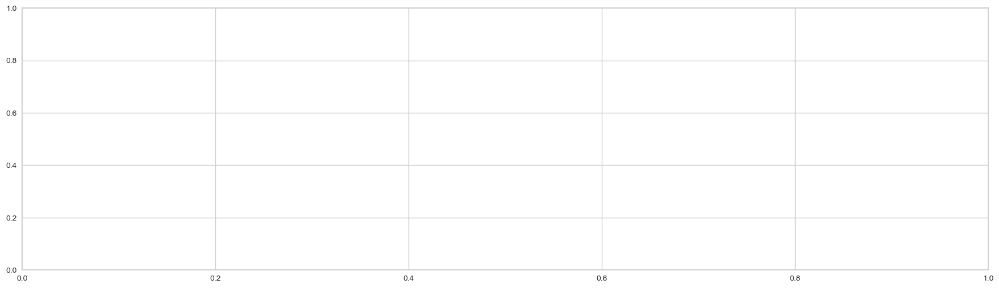

In [ ]:
#El compare models no está funcionando, así sabiendo que el mejor modelo es el de Random Forest, vamos a crear un modelo con este algoritmo y lo comparamos con modelo de regresión logística y decision tree.

# Random Forest Classifier
rf = create_model('rf')  
# Evaluate models
evaluate_model(rf)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,17:59:47
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6231,0.6840,0.6231,0.5818,0.5783,0.2364,0.2633
1,0.6138,0.6714,0.6138,0.5678,0.5722,0.2226,0.2426
2,0.6147,0.6702,0.6147,0.5731,0.5689,0.2185,0.2447
3,0.6231,0.6811,0.6231,0.5792,0.5810,0.2402,0.2632
4,0.6118,0.6692,0.6118,0.5649,0.5730,0.2223,0.2390
5,0.6159,0.6759,0.6159,0.5722,0.5732,0.2247,0.2473
6,0.6101,0.6738,0.6101,0.5631,0.5693,0.2165,0.2349
7,0.6075,0.6681,0.6075,0.5635,0.5648,0.2076,0.2286
8,0.6152,0.6758,0.6152,0.5705,0.5736,0.2249,0.2458


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

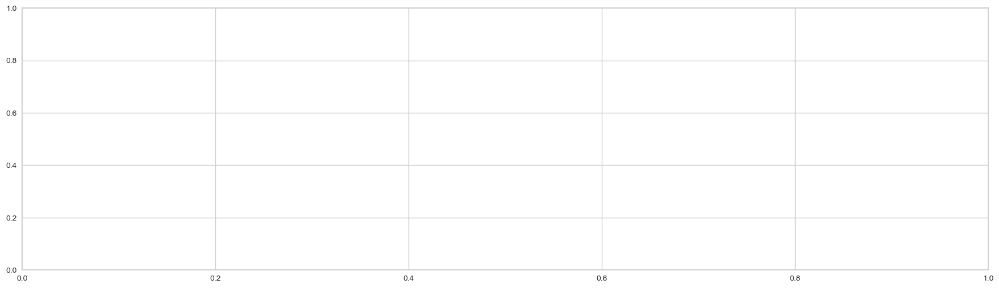

In [ ]:
#Logistic Regression
lr = create_model('lr')  # Logistic Regression

# Evaluate models
evaluate_model(rf)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,18:00:02
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7268,0.7563,0.7268,0.7281,0.7274,0.5056,0.5056
1,0.7321,0.7641,0.7321,0.7330,0.7324,0.5165,0.5166
2,0.7333,0.7656,0.7333,0.7353,0.7342,0.5194,0.5195
3,0.7306,0.7629,0.7306,0.7338,0.7321,0.5154,0.5155
4,0.7398,0.7721,0.7398,0.7430,0.7412,0.5322,0.5324
5,0.7249,0.7575,0.7249,0.7270,0.7259,0.5039,0.5039
6,0.7352,0.7690,0.7352,0.7388,0.7369,0.5240,0.5242
7,0.7309,0.7622,0.7309,0.7322,0.7315,0.5132,0.5132
8,0.7215,0.7540,0.7215,0.7229,0.7222,0.4974,0.4974


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

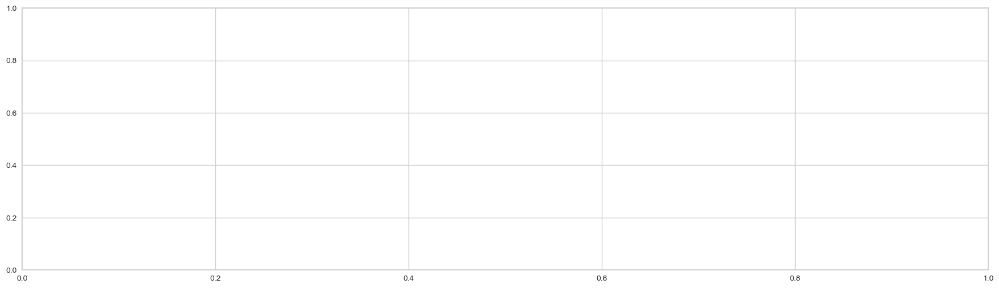

In [ ]:
# Decision Tree
dt = create_model('dt')  

# Evaluate models
evaluate_model(dt)


Con un Accuracy 0.8032, un AUC 0.9028 y un F1 0.7963, definitivamente el modelo que vamos a explorar es Random Forest.	

### 5.2 Random Forest Classifier

#### 5.2.1 Preparado de la data para el modelo

In [ ]:
# Exploramos nuevamente la tabla de data_final para ver cuáles de los valores faltan por convertir en numéricas
data_final.head()

,id,status_group,amount_tsh,funder,installer,latitude,basin,subvillage,region,region_code,...,construction_year,gps_height,population,longitude,year_recorded,day_of_week_recorded,month_recorded_cat,age,amount_tsh_missing,amount_tsh_binned
0,69572,functional,6000.0,38,24,-9.856322,1,13116,3,2,...,1999,1390,109,34.938093,2011,0,1,12,0,>2000
1,8776,functional,0.0,29,24,-2.147466,4,17596,9,12,...,2010,1399,280,34.698766,2013,2,1,3,0,0
2,34310,functional,25.0,29,47,-3.821329,5,10096,8,13,...,2009,686,250,37.460664,2013,0,1,4,0,1-500
3,67743,non functional,0.0,52,39,-11.155298,7,9998,12,25,...,1986,263,58,38.486161,2013,0,1,27,0,0
4,19728,functional,0.0,29,24,-1.825359,4,8583,4,9,...,1996,327,131,31.130847,2011,2,2,15,0,0


In [ ]:
# Convertimos las variables que faltan, empezando por status_group
data_final['status_group'] = label_encoder.fit_transform(data_final['status_group'])

In [ ]:
# Lo mismo con las variables que faltan
from sklearn.preprocessing import LabelEncoder

columns_to_encode = [
    'funder','installer', 'basin', 'subvillage','region','lga', 'ward','public_meeting', 'permit', 'extraction_type', 'extraction_type_class', 
    'management','management_group','payment', 'water_quality','quality_group','quantity', 'quantity_group', 'source', 'source_type','source_class','waterpoint_type','month_recorded_cat'
]
for column in columns_to_encode:
    le = LabelEncoder()
    data_final[column] = le.fit_transform(data_final[column])

In [ ]:
# Terminamos con amount_tsh_binned,y vamos a dejar  amount_tsh solo para probar. Si vemos que no hace diferencia la eliminamos.
data_final['amount_tsh_binned'] = label_encoder.fit_transform(data_final['amount_tsh_binned'])

#### 5.2.2. Salvado de data

In [ ]:
data_final.to_csv('/Users/aprilm/Data_science/machine_learning/water_table/data_final_procesada_RF.csv', index=False)

#### 5.2.3 Encoring

In [ ]:
# Devolvemos la data a su estado original, training y test usando el id.
train_set = data_final[data_final ["id"].isin(train_data["id"])]
test_set =  data_final[data_final ["id"].isin(test_data["id"])]

In [ ]:
# En el train set, eliminamos la columna id y la columna status_group y guardarlas en X e y respectivamente
X_train = train_set.drop(['id', 'status_group'], axis=1)
y_train = train_set['status_group']
X_test = test_set.drop(['id', 'status_group'], axis=1)

## 6 Modelo Random Forest Classifier

##### 6.1 Modelo1C


In [ ]:
#Model1C 
model1C = RandomForestClassifier()
model1C.fit(X_train, y_train)


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [ ]:
y_pred_test = model1C.predict(X_test)
submission_format = pd.read_csv('/Users/aprilm/Data_science/machine_learning/water_table/SubmissionFormat.csv')
submission_df = pd.DataFrame({'id': test_set['id'], 'status_group': y_pred_test})
label_dict_inverse = {0: 'functional', 1: 'functional needs repair', 2: 'non functional'}
submission_df['status_group'] = submission_df['status_group'].map(label_dict_inverse)
submission_df.to_csv('/Users/aprilm/Desktop/submission.csv', index=False)


### <center>  ---> Model 1C 0.8153 <--- 

##### 6.2 Importancia de las variables

<AxesSubplot: >

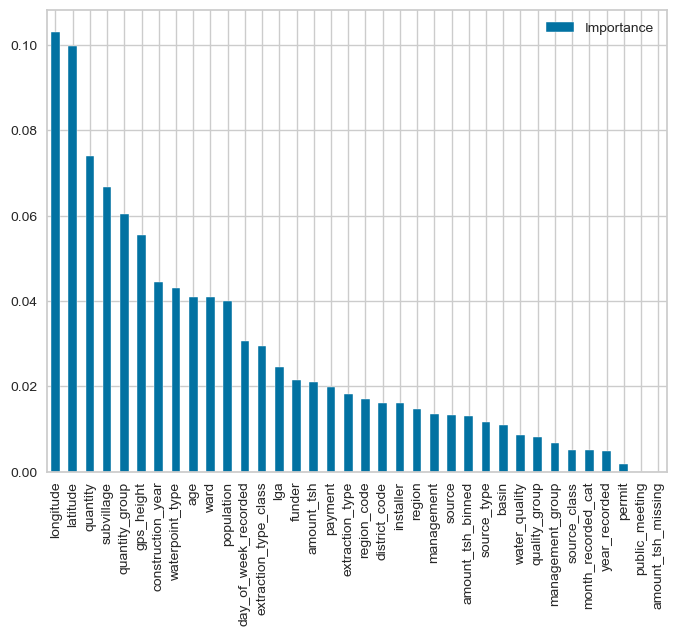

In [ ]:
feat_importances = pd.DataFrame(model1C.feature_importances_, index=X_train.columns, columns=["Importance"])
feat_importances.sort_values(by='Importance', ascending=False, inplace=True)
feat_importances.plot(kind='bar', figsize=(8,6))

In [ ]:
feat_importances

,Importance
longitude,0.103203
latitude,0.099753
quantity,0.073906
subvillage,0.066720
quantity_group,0.060433
gps_height,0.055462
construction_year,0.044363
waterpoint_type,0.043041
age,0.041008
ward,0.040919


##### 6.3 Feature engineering

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def proporciones_final(var, target, df):
    proporcion = pd.DataFrame()
    
    proporcion['%target'] = df[target].groupby(df[var]).mean() * 100
    proporcion['Count'] = df[target].groupby(df[var]).count()
    proporcion = proporcion.round(3)
    proporcion_filtered = proporcion[(proporcion['%target'] > 0) & (proporcion['Count'] > 10)]

    if 1 < len(proporcion_filtered) < 100:
        fig = plt.figure()
        ax = proporcion_filtered['Count'].plot(kind='bar', grid=True)
                
        ax2 = ax.twinx()
        ax2.plot(proporcion_filtered['%target'].values, linestyle='-', linewidth=2.0, color='g')
        plt.tight_layout()
    else:
        proporcion_filtered.reset_index(inplace=True)
        sns.lmplot(x=var, y='%target', data=proporcion_filtered, fit_reg=True, ci=None)



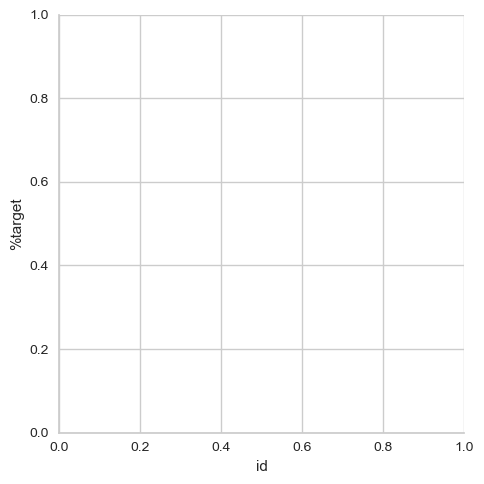

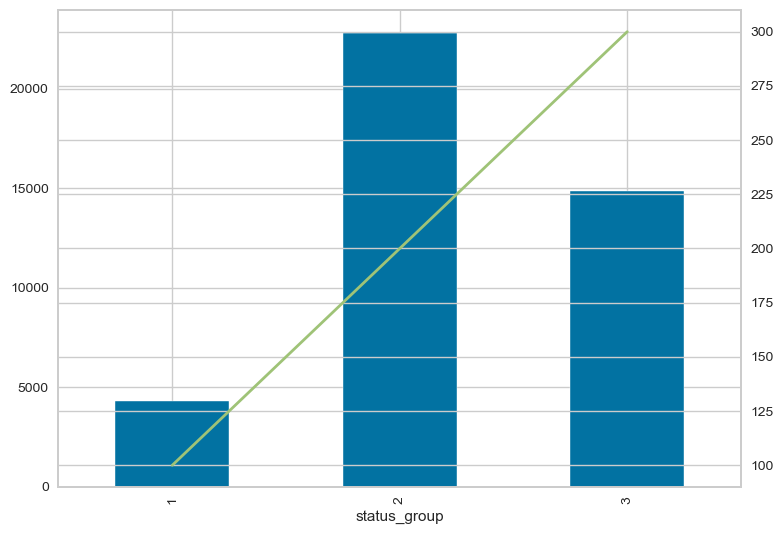

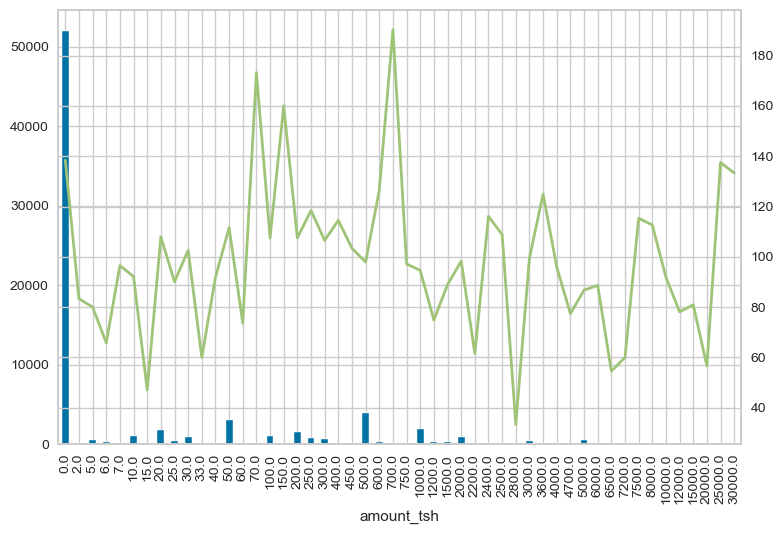

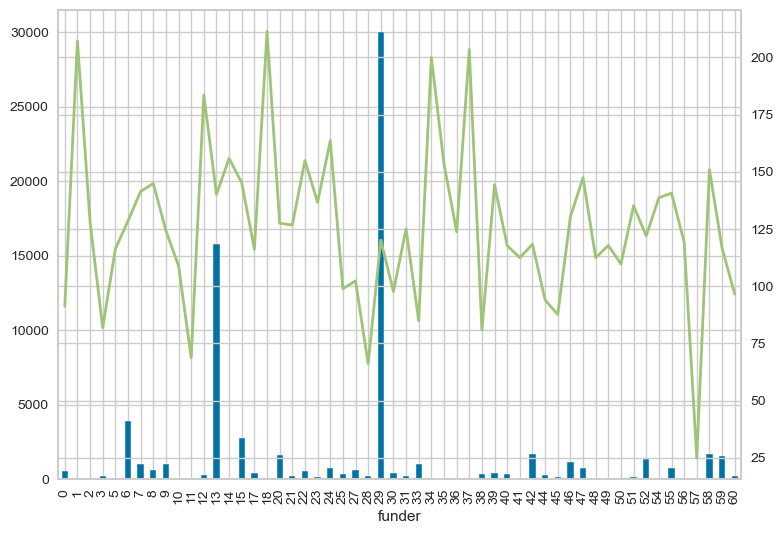

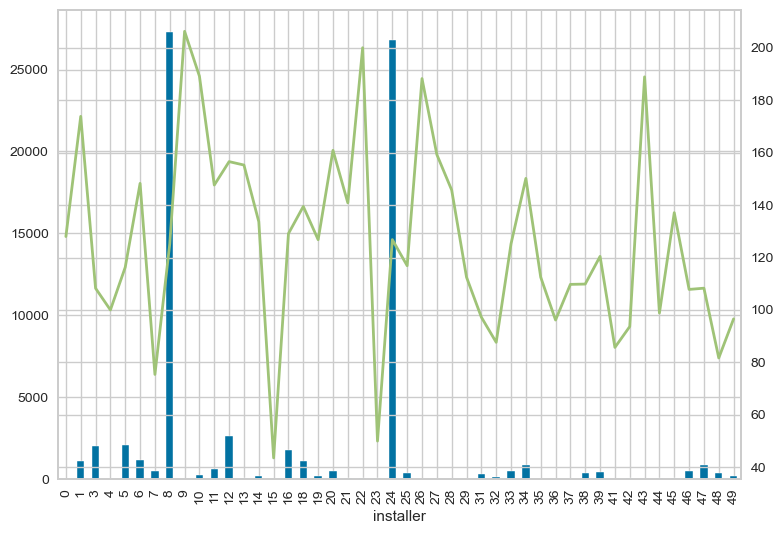

...

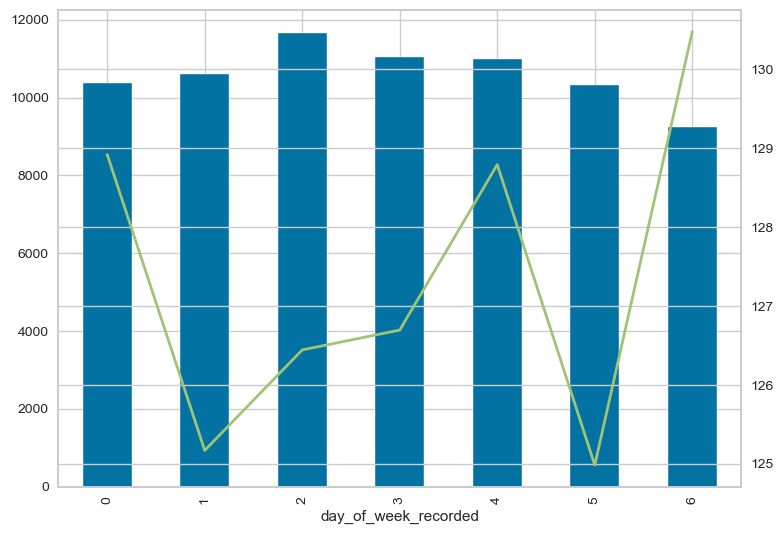

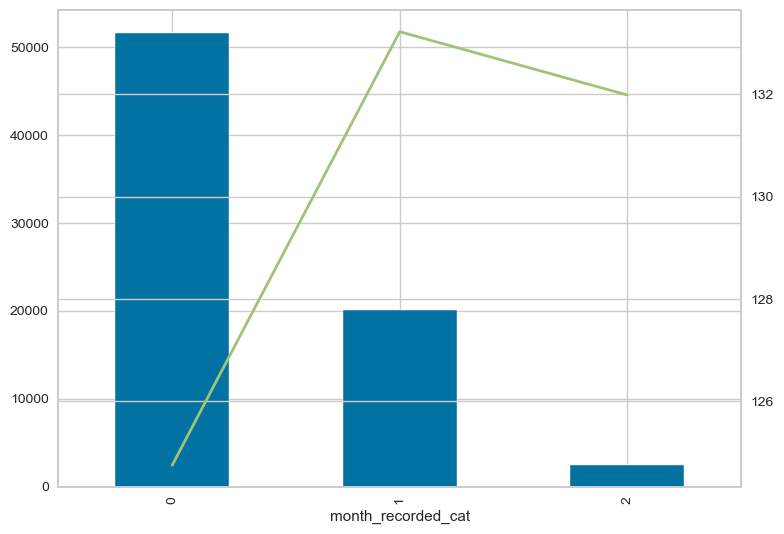

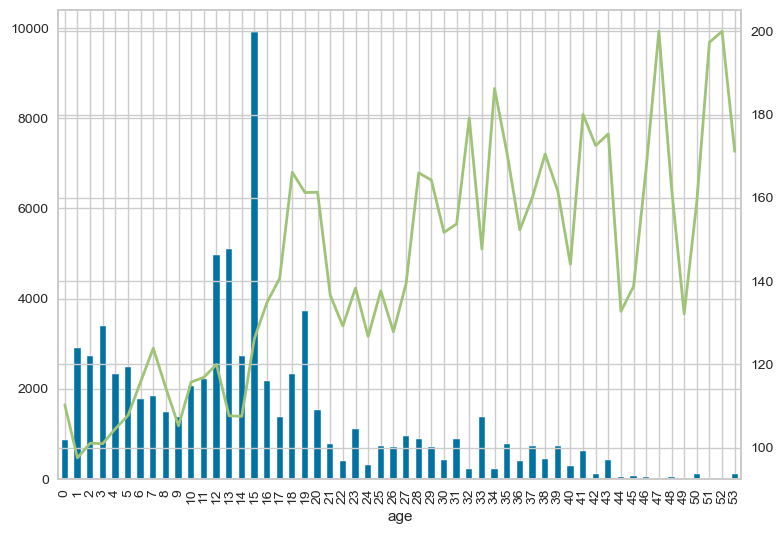

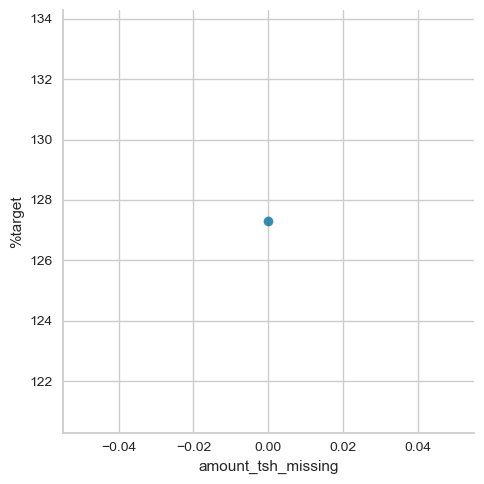

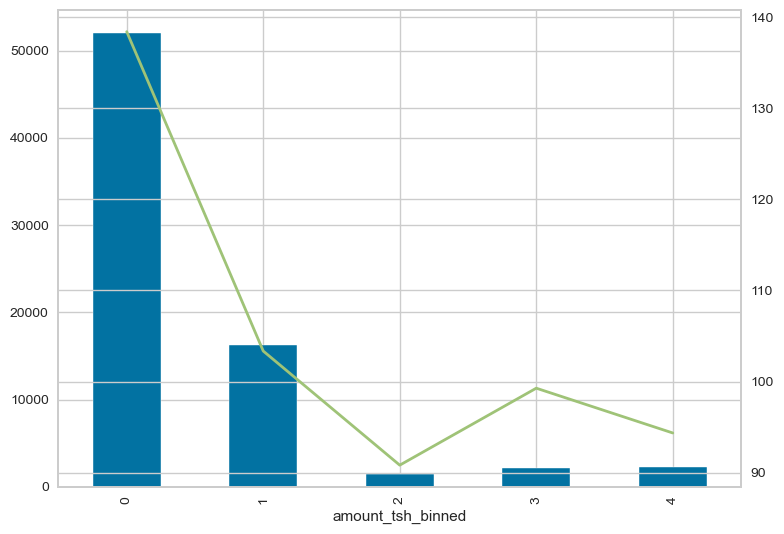

In [ ]:
for i in data_final.columns:
    proporciones_final (i, 'status_group', data_final)

        
for i in data_final.columns:
    if i != 'status_group':
        proporciones_final(i, 'status_group', data_final)

#### 6.3.1 Age

La gráfica de age sugiere que hay dos picos importantes de bombas funcionales a los 18 años y luego cae abruptamente 22 para luego tener un crecimiento sostenido desde los 29 años hasta 44 (como la vida misma). Sube y vuelve a caer a los 47 y luego oscila con picos bastante fuertes hasta los 53 años. Vamos a dividir esta variable creando nuevas columnas.

In [ ]:
## AGE (realizamos una variable con 4 rangos de edad y 4 variables con esos mismos rangos)
data_final['age_0_17'] = data_final['age'].apply(lambda x: 1 if x<=17 else 0)
data_final['age_18_44'] = data_final['age'].apply(lambda x: 1 if x>17 & x<=44 else 0)
data_final['age_45_49'] = data_final['age'].apply(lambda x: 1 if x>44 & x<=49 else 0)
data_final['age_50_53'] = data_final['age'].apply(lambda x: 0 if x>49 & x<53 else 0)

In [ ]:
corr = abs(data_final.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False).style.background_gradient()

,status_group
status_group,1.000000
age_0_17,0.157685
age,0.154627
construction_year,0.154257
waterpoint_type,0.130945
amount_tsh_binned,0.119399
extraction_type_class,0.117207
quality_group,0.096130
quantity_group,0.082482
quantity,0.082482


Nos encontramos con que age 0_17 tiene una correlación interesante. La usaremos en el modelo.

In [ ]:
data_final.head()

,id,status_group,amount_tsh,funder,installer,latitude,basin,subvillage,region,region_code,...,year_recorded,day_of_week_recorded,month_recorded_cat,age,amount_tsh_missing,amount_tsh_binned,age_0_17,age_18_44,age_45_49,age_50_53
0,69572,0,6000.0,38,24,-9.856322,1,13116,3,2,...,2011,0,0,12,0,4,1,1,0,0
1,8776,0,0.0,29,24,-2.147466,4,17596,9,12,...,2013,2,0,3,0,0,1,1,1,0
2,34310,0,25.0,29,47,-3.821329,5,10096,8,13,...,2013,0,0,4,0,1,1,1,0,0
3,67743,2,0.0,52,39,-11.155298,7,9998,12,25,...,2013,0,0,27,0,0,0,1,1,0
4,19728,0,0.0,29,24,-1.825359,4,8583,4,9,...,2011,2,1,15,0,0,1,1,1,0


#### 6.3.2. Construction year

La gráfica construction year sugiere que hay varios picos importantes:
1960 al 1965, 1965 al 1971, 1972 al 1995, 1996 al 2010, 2010 al 2013. Vamos a separar la variable construction year para ver si logramos obtener mejor información.

In [ ]:
## Construction year 
data_final['Contruction_1960_1965'] = data_final['construction_year'].apply(lambda x: 1 if x<=1965 else 0)
data_final['Contruction_1966_1971'] = data_final['construction_year'].apply(lambda x: 1 if x>1965 & x<=1971 else 0)
data_final['Contruction_1972_1995'] = data_final['construction_year'].apply(lambda x: 1 if x>1971 & x<=1995 else 0)
data_final['Contruction_1996_2010'] = data_final['construction_year'].apply(lambda x: 0 if x>1995 & x<=2010 else 0)
data_final['Contruction_2011_2013'] = data_final['construction_year'].apply(lambda x: 0 if x>2010 & x<=2013 else 0)

In [ ]:
corr = abs(data_final.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False).style.background_gradient()

,status_group
status_group,1.000000
age_0_17,0.157685
age,0.154627
construction_year,0.154257
waterpoint_type,0.130945
amount_tsh_binned,0.119399
extraction_type_class,0.117207
quality_group,0.096130
quantity_group,0.082482
quantity,0.082482


A diferencia de years, constrution year no ofrece ninguna nueva variable de interés.

#### 6.3.3 Otras variables

In [ ]:
#quantity_group
data_final['quantity_group_0-1'] = data_final['quantity_group'].apply(lambda x: 1 if x<=1 else 0)
data_final['quantity_group_2-4'] = data_final['quantity_group'].apply(lambda x: 1 if x>1 & x<=4 else 0)
data_final['quantity_group_4-5'] = data_final['quantity_group'].apply(lambda x: 1 if x>4 & x<=5 else 0)

#waterpoint_type
data_final['waterpoint_type_0-2'] = data_final['waterpoint_type'].apply(lambda x: 1 if x<=2 else 0)
data_final['waterpoint_type_2-5'] = data_final['waterpoint_type'].apply(lambda x: 1 if x>2 & x<=5 else 0)
data_final['waterpoint_type_5-6'] = data_final['waterpoint_type'].apply(lambda x: 1 if x>5 & x<=6 else 0)


#amount_tsh_binned
data_final['amount_tsh_binned_0-2'] = data_final['amount_tsh_binned'].apply(lambda x: 1 if x<=2 else 0)
data_final['amount_tsh_binned_2-4'] = data_final['amount_tsh_binned'].apply(lambda x: 1 if x>2 & x<=4 else 0)

#extraction_type_class
data_final['#extraction_type_class_0-1'] = data_final['extraction_type_class'].apply(lambda x: 1 if x<=1 else 0)
data_final['#extraction_type_class_2-4'] = data_final['extraction_type_class'].apply(lambda x: 1 if x>1 & x<=4 else 0)
data_final['#extraction_type_class_5-6'] = data_final['extraction_type_class'].apply(lambda x: 1 if x>4 & x<=6 else 0)

In [ ]:
corr = abs(data_final.corr())
corr[['status_group']].sort_values(by = 'status_group',ascending = False).style.background_gradient()

,status_group
status_group,1.000000
quantity_group_4-5,0.251569
waterpoint_type_5-6,0.201806
#extraction_type_class_2-4,0.167740
#extraction_type_class_0-1,0.167740
age_0_17,0.157685
age,0.154627
construction_year,0.154257
waterpoint_type,0.130945
amount_tsh_binned_2-4,0.130368


In [ ]:
list(corr[['status_group']].sort_values(by = 'status_group',ascending = False).index)

['status_group',
 'quantity_group_4-5',
 'waterpoint_type_5-6',
 '#extraction_type_class_2-4',
 '#extraction_type_class_0-1',
 'age_0_17',
 'age',
 'construction_year',
 'waterpoint_type',
 'amount_tsh_binned_2-4',
 'amount_tsh_binned',
 'extraction_type_class',
 'quality_group',
 '#extraction_type_class_5-6',
 'quantity',
 'quantity_group',
 'gps_height',
 'extraction_type',
 'waterpoint_type_2-5',
 'amount_tsh_binned_0-2',
 'waterpoint_type_0-2',
 'source',
 'region',
 'payment',
 'source_type',
 'region_code',
 'management',
 'lga',
 'amount_tsh',
 'basin',
 'funder',
 'Contruction_1972_1995',
 'age_45_49',
 'month_recorded_cat',
 'age_18_44',
 'Contruction_1960_1965',
 'installer',
 'Contruction_1966_1971',
 'source_class',
 'management_group',
 'year_recorded',
 'longitude',
 'quantity_group_0-1',
 'quantity_group_2-4',
 'permit',
 'latitude',
 'ward',
 'subvillage',
 'district_code',
 'day_of_week_recorded',
 'water_quality',
 'id',
 'population',
 'public_meeting',
 'amount_tsh_

### 6.4 Selección variables (nuevas)

In [ ]:
selection = SelectKBest(k = 20)
feature_selection = selection.fit_transform(data_final, data_final['status_group'])

variables = list(np.asarray(list(data_final))[selection.get_support()])
variables.sort()
print(variables)

['#extraction_type_class_0-1', '#extraction_type_class_2-4', '#extraction_type_class_5-6', 'age', 'age_0_17', 'amount_tsh_binned', 'amount_tsh_binned_2-4', 'construction_year', 'extraction_type', 'extraction_type_class', 'gps_height', 'longitude', 'quality_group', 'quantity', 'quantity_group', 'quantity_group_4-5', 'status_group', 'waterpoint_type', 'waterpoint_type_2-5', 'waterpoint_type_5-6']


In [ ]:
final_features = ['id', 'status_group', '#extraction_type_class_0-1','#extraction_type_class_2-4', '#extraction_type_class_5-6', 'age', 'age_0_17', 
 'amount_tsh_binned', 'amount_tsh_binned_2-4', 'construction_year', 'extraction_type', 'extraction_type_class', 'gps_height', 'longitude','quality_group', 
 'quantity', 'quantity_group', 'quantity_group_4-5', 'waterpoint_type', 'waterpoint_type_2-5', 'waterpoint_type_5-6']

In [ ]:
#Vamos a devolver la data a su estado original, training y test usando el id.
train_set = data_final[data_final ["id"].isin(train_data["id"])]
test_set =  data_final[data_final ["id"].isin(test_data["id"])]

In [ ]:
# En el train set, vamos a eliminar la columna id y la columna status_group y guardarlas en X e y respectivamente
X_train = train_set.drop(['id', 'status_group'], axis=1)
y_train = train_set['status_group']
X_test = test_set.drop(['id', 'status_group'], axis=1)

#### 6.5 Modelo 2C (con feature engineering)

In [ ]:
#Predecimos el modelo 2 con los nuevos datos
model2C = RandomForestClassifier()
model2C.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [ ]:
y_pred_test = model2C.predict(X_test)

In [ ]:
submission_df = pd.DataFrame({'id': test_set['id'], 'status_group': y_pred_test})

In [ ]:
label_dict_inverse = {0: 'functional', 1: 'functional needs repair', 2: 'non functional'}
submission_df['status_group'] = submission_df['status_group'].map(label_dict_inverse)

In [ ]:
submission_df.to_csv('/Users/aprilm/Desktop/submission2C.csv', index=False)

<AxesSubplot: >

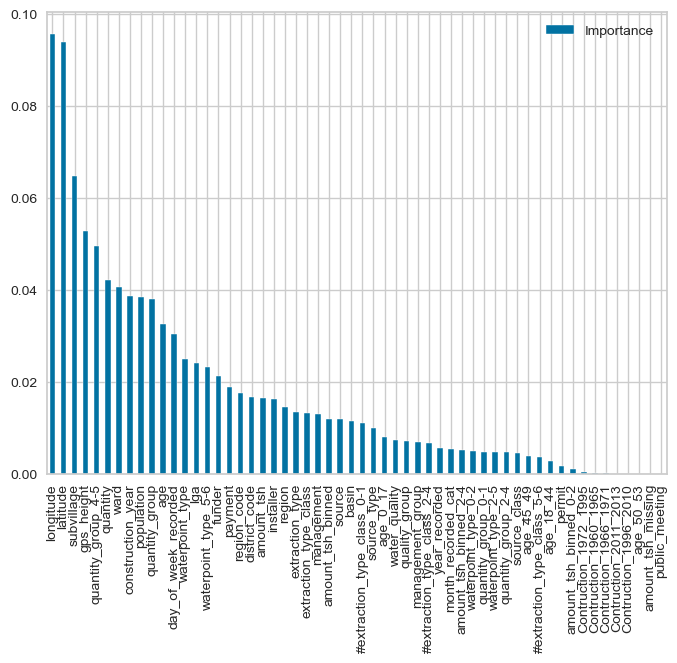

In [ ]:
#vamos a ver las variales mas importantes de este nuevo modelo 
feat_importances = pd.DataFrame(model2C.feature_importances_, index=X_train.columns, columns=["Importance"])
feat_importances.sort_values(by='Importance', ascending=False, inplace=True)
feat_importances.plot(kind='bar', figsize=(8,6))

### <center> ----> 0.8116 Usando el data_train con todas las variables + las de engineering) <----

In [ ]:
# Salvamos esta nueva data final, de manera de poder usarla en los modelos que construya mas adelante
data_final.to_csv('/Users/aprilm/Desktop/data_final_modelo2.csv', index=False)

#### 6.6 Modelo 3C (solo con determinadas variables)

In [ ]:
#En este modelo solo vamos a usar las variables mas importantes, para ello vamos a crear un nuevo dataset con esatas nuevas variables
data_final_nv = data_final[final_features]

In [ ]:
#Vamos a devolver la data a su estado original, training y test usando el id.
train_set_nv = data_final_nv[data_final_nv ["id"].isin(train_data["id"])]
test_set_nv =  data_final_nv[data_final_nv ["id"].isin(test_data["id"])]

In [ ]:
# En el train set, vamos a eliminar la columna id y la columna status_group y guardarlas en X e y respectivamente
X_train_nv = train_set_nv.drop(['id', 'status_group'], axis=1)
y_train_nv = train_set_nv['status_group']
X_test_nv = test_set_nv.drop(['id', 'status_group'], axis=1)

In [ ]:
model3C = RandomForestClassifier()
model3C.fit(X_train_nv, y_train_nv)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [ ]:
# Calculamos las predicciones para el test set
y_pred_test_nv = model3C.predict(X_test_nv)

In [ ]:
# Preparamos el archivo de submission
submission_df = pd.DataFrame({'id': test_set_nv['id'], 'status_group': y_pred_test_nv})

In [ ]:
label_dict_inverse = {0: 'functional', 1: 'functional needs repair', 2: 'non functional'}
submission_df['status_group'] = submission_df['status_group'].map(label_dict_inverse)

In [ ]:
submission_df.to_csv('/Users/aprilm/Desktop/submission3C.csv', index=False)

### <center> ----> Score 0.7720 (usando el data train solo con las variables mas importantes) <----

In [ ]:
#guardo la data final del modelo 3
data_final_nv.to_csv('/Users/aprilm/Desktop/data_final_modelo3.csv', index=False)

#### 6.7 Tuneo de hiperparámetros (Grid search)

In [5]:
#Queremos ver si podemos mejorar el modelo 1C, haciendo un tuneo de los parámetros. Tomamos el modelo1, porque es al que hasta ahora ha tenido mejor resultado
#Usamos la data_final_modelo1 que habíamos guardado anteriormente, ya que esta no tiene las variables modificadas por feature engineering.
#Vamos a usar GridSearchCV para encontrar los mejores parámetros para el modelo 1C

data_final_m1 = pd.read_csv('/Users/aprilm/Data_science/machine_learning/water_table/data_final_modelo1.csv')

In [6]:
#Devolvemos la data a su estado original, training y test usando el id.
train_set_m1 = data_final_m1[data_final_m1 ["id"].isin(train_data["id"])]
test_set_m1 =  data_final_m1[data_final_m1 ["id"].isin(test_data["id"])]

In [7]:
# En el train set, eliminamos la columna id y la columna status_group y guardarlas en X e y respectivamente
X_train_m1 = train_set_m1.drop(['id', 'status_group'], axis=1)
y_train_m1 = train_set_m1['status_group']
X_test_m1 = test_set_m1.drop(['id', 'status_group'], axis=1)

In [ ]:
#Estimamos los hiperparametros del modelo 2C
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 20, 40],
    'min_samples_split': [2, 5 ],
    'min_samples_leaf': [1, 4],
    'max_features': ['auto', 'sqrt']}

In [ ]:
model_grid = GridSearchCV(estimator=model1C, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=2)

In [ ]:
#Hacemos el fit del moelo
model_grid.fit(X_train_m1, y_train_m1)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for 

[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  17.1s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  17.1s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  17.1s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for 

[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  17.3s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  17.3s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  16.8s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  16.7s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  17.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  34.5s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  34.6s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  34.7s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for 

[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  17.2s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  17.3s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  35.2s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  35.3s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  20.2s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  21.8s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  22.1s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  41.0s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  40.9s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  41.1s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  41.3s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  19.0s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  17.8s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  43.6s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  19.0s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  36.3s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  18.9s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  36.3s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  36.1s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  36.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  36.0s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  18.2s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  17.3s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  17.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  20.6s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  35.0s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  34.7s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  34.8s
[CV] END max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  34.8s
[CV] END max_depth=None,

/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for 

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  34.2s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  17.5s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  17.5s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  17.6s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for 

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  33.9s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  33.6s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  33.8s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  34.2s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  18.5s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  18.6s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  17.6s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  17.5s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  17.8s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  36.8s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  36.9s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  36.7s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  36.1s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  36.4s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  17.3s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  17.7s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  16.8s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  16.8s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  17.1s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  35.6s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  35.5s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  35.6s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  35.7s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  17.3s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  17.4s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  36.4s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  17.3s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  17.2s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  17.4s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  34.4s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  34.9s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  34.7s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  35.2s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for 

[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  34.8s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  18.0s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  17.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  19.3s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  37.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  21.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  21.5s
[CV] END max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  38.2s
[CV] END max_depth=20, max_features=auto

/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  16.4s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  32.0s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  18.3s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  18.3s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  18.6s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  31.7s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  31.5s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  31.6s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  31.5s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  19.1s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  18.8s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  18.7s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  18.6s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  18.7s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  38.3s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  38.6s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  38.3s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  38.3s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  18.7s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  38.6s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100; total time=  18.5s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  17.0s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  17.1s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  17.2s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  37.6s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  37.4s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  37.3s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  37.4s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  17.1s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=  17.4s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=  37.8s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  17.1s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  17.1s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  17.2s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  35.0s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  34.7s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  34.8s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  34.4s


/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=  36.2s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  18.2s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=100; total time=  17.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  19.0s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  34.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  19.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=  19.1s
[CV] END max_depth=40, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=200; total time=  33.7s
[CV] END max_depth=40, max_features=auto

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='sqrt',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                              warm_start=False),
             n_jobs=-1,
             param_grid={'max_depth': [None, 20, 40],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 4],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='accuracy', verbose=2)

In [ ]:
print(model_grid.best_params_)

{'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}


In [ ]:
print(model_grid.best_score_)

0.8127777777777776


#### 6.8 Modelo 4C

In [ ]:
# Usamos el nuevo tunning (Grid search) para el modelo 4C 
model4C = RandomForestClassifier(max_depth=None, max_features='auto', min_samples_leaf=1, min_samples_split=5,  n_estimators=200)
model4C.fit(X_train_m1,y_train_m1)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=200, n_jobs=None, oob_score=False,
                       random_state=None, verbose=0, warm_start=False)

In [ ]:
# Calculamos las predicciones para el test set
y_pred_test = model4C.predict(X_test_m1)

In [ ]:
# Preparamos el archivo de submission
submission_df = pd.DataFrame({'id': test_set_m1['id'], 'status_group': y_pred_test})

In [ ]:
label_dict_inverse = {0: 'functional', 1: 'functional needs repair', 2: 'non functional'}
submission_df['status_group'] = submission_df['status_group'].map(label_dict_inverse)

In [20]:
submission_df.to_csv('/Users/aprilm/Desktop/submission4C.csv', index=False)

## <center> <font color='blue'> ---> Score 0.8201 ranking 1573 <----

#### 6.9 Tuneo de hiperparámetros (Bayesian optimization)

In [12]:
# Instalamos optuna
! pip install optuna

  Using cached optuna-3.1.1-py3-none-any.whl (365 kB)
  Using cached alembic-1.10.4-py3-none-any.whl (212 kB)
  Using cached cmaes-0.9.1-py3-none-any.whl (21 kB)
  Using cached colorlog-6.7.0-py2.py3-none-any.whl (11 kB)
  Using cached Mako-1.2.4-py3-none-any.whl (78 kB)


In [13]:
import optuna
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

In [14]:
# Creamos una funcion para optimizar los hiperparametros
def objective(trial):
    n_estimators = trial.suggest_int("n_estimators", 100, 200)
    max_depth = trial.suggest_int("max_depth", 10, 50)
    min_samples_split = trial.suggest_int("min_samples_split", 2, 5)
    min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 4)
    max_features = trial.suggest_categorical("max_features", ['auto', 'sqrt'])
    
    clf = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        max_features=max_features,
        random_state=42
    )
    
    score = cross_val_score(clf, X_train_m1, y_train_m1, cv=5, n_jobs=-1, scoring='accuracy')
    return score.mean()

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50)

print("Best trial:")
trial = study.best_trial
print("  Value: {}".format(trial.value))
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))


[I 2023-04-27 11:00:01,548] A new study created in memory with name: no-name-56f408d8-7e70-4587-8cf5-52f9ab9efff3
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the 

Best trial:
  Value: 0.8143939393939394
  Params: 
    n_estimators: 179
    max_depth: 28
    min_samples_split: 3
    min_samples_leaf: 2
    max_features: auto


### 6.10 Modelo 5C

In [15]:
# Usamos el nuevo tunning (Bayesian optimization) para el modelo 5C
model5C = RandomForestClassifier(max_depth=28, max_features='auto', min_samples_leaf=2, min_samples_split=3,  n_estimators=179)
model5C.fit(X_train_m1,y_train_m1)

/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


RandomForestClassifier(max_depth=28, max_features='auto', min_samples_leaf=2,
                       min_samples_split=3, n_estimators=179)

In [16]:
# Calculamos las predicciones para el test set
y_pred_test = model5C.predict(X_test_m1)

In [17]:
# Preparamos el archivo de submission
submission_df = pd.DataFrame({'id': test_set_m1['id'], 'status_group': y_pred_test})

In [18]:
label_dict_inverse = {0: 'functional', 1: 'functional needs repair', 2: 'non functional'}
submission_df['status_group'] = submission_df['status_group'].map(label_dict_inverse)

In [19]:
submission_df.to_csv('/Users/aprilm/Desktop/submission5C.csv', index=False)

### <center> ---> Score 0.8178  <----

#### 6.11 Balanceo de datos

Intantamos mejorar el modelo con un balanceo de datos. 

In [9]:
# Queremos ver como está distribuido el target
print("Before OverSampling, counts of label '2': {}".format(sum(data_final_m1.status_group==2)))
print("Before OverSampling, counts of label '1': {}".format(sum(data_final_m1.status_group==1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(data_final_m1.status_group==0)))

Before OverSampling, counts of label '2': 22824
Before OverSampling, counts of label '1': 4317
Before OverSampling, counts of label '0': 32259 



In [28]:
from imblearn.over_sampling import SMOTE

In [38]:
# Al tener 3 clases, mis sampling strategy tiene que ser manual, porque con default obtengo que las tres variables quedan con la misma cantidad de datos.
# Por lo tanto vamos a crear un diccionario donde podemos controlar la cantidad de datos que queremos para cada clase
#Class_0 = 0.54
#Class_1 = 0.07
#Class_2 = 0.39

class_0_target = 32259  # Mantenemos orinal.
class_1_target = int(32259 * 0.5)  # Oversample class 1 para tener 50% del class 0
class_2_target = int(32259 * 0.75)  # Oversample class 2 to have 75% del class 0

#creamos un dccionario con las nuevas varaibles
sampling_strategy_dict = {
    0: class_0_target,
    1: class_1_target,
    2: class_2_target
}

In [40]:
# Aplicamos SMOTE
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42, sampling_strategy=sampling_strategy_dict)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_m1, y_train_m1)

# vamos a ver como quedaron los datos
unique, counts = np.unique(y_train_resampled, return_counts=True)
print("After OverSampling, counts of label '0':", counts[0])
print("After OverSampling, counts of label '1':", counts[1])
print("After OverSampling, counts of label '2':", counts[2])


After OverSampling, counts of label '0': 32259
After OverSampling, counts of label '1': 16129
After OverSampling, counts of label '2': 24194


#### 6.12 Modelo 6C con oversampling

In [41]:
#Para este modelo vamos a usar la nueva muestra con oversampling.
model6C = RandomForestClassifier()
model6C.fit(X_train_resampled,y_train_resampled)

RandomForestClassifier()

In [43]:
# Calculamos las predicciones para el test set
y_pred_test = model6C.predict(X_test_m1)

In [45]:
# Preparamos el archivo de submission
submission_df = pd.DataFrame({'id': test_set_m1['id'], 'status_group': y_pred_test})

In [46]:
label_dict_inverse = {0: 'functional', 1: 'functional needs repair', 2: 'non functional'}
submission_df['status_group'] = submission_df['status_group'].map(label_dict_inverse)

In [54]:
submission_df.to_csv('/Users/aprilm/Desktop/submission6C.csv', index=False)

### <center> ---> Score 0.8178  <----

#### 6.13 Modelo 7C con oversampling y con el tuneo de hiperparametros que se utilizó en el modelo 4C 

In [48]:
#Para este modelo vamos a usar la nueva muestra con oversampling y vamos a optimizar los hiperparametros con el tuning grid search
model7C = RandomForestClassifier(max_depth=None, max_features='auto', min_samples_leaf=1, min_samples_split=5,  n_estimators=200)
model7C.fit(X_train_resampled,y_train_resampled)

/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


RandomForestClassifier(max_features='auto', min_samples_split=5,
                       n_estimators=200)

In [49]:
# Calculamos las predicciones para el test set
y_pred_test = model7C.predict(X_test_m1)

In [50]:
# Preparamos el archivo de submission
submission_df = pd.DataFrame({'id': test_set_m1['id'], 'status_group': y_pred_test})

In [51]:
label_dict_inverse = {0: 'functional', 1: 'functional needs repair', 2: 'non functional'}
submission_df['status_group'] = submission_df['status_group'].map(label_dict_inverse)

In [52]:
# Salvamos el archivo
submission_df.to_csv('/Users/aprilm/Desktop/submission7C.csv', index=False)

### <center> ---> Score 0.8158  <----


---------------------------------------------------------------------------------------------------------------------------

### 6.14. Conclusión usando el modelo RandomForestClassifier

---------------------------------------------------------------------------------------------------------------------------------------------------------------------

La elección de usar RandomForestClassifier fue tomada tras el resultado de pycaret. A partir del resultado inicial (score 0.81) se decidió hacer diferentes modificaciones buscar un mejor score.

* Model 1C ---> score 0.8153. 

    Se utilizó la data limpia y preprocesado inicial (paso 3 y paso 4).
* Model 2C ---> score 0.8116

    Se determinó la importancia de las variables (paso 6.2) y a partir de los resultados se realizó un feature engineering a las  variables más importantes (paso 6.3). : age, contruction_year, quantity_group, waterpoint_type, amount_tsh_binned, extration_type_class.
* Model 3C ---> score 0.7720

    Se tomaron solo las variables más representativas y con mayor correlación. Estas variables fueron: '#extraction_type_class_0-1','#extraction_type_class_2-4', '#extraction_type_class_5-6', 'age', 'age_0_17', 'amount_tsh_binned', 'amount_tsh_binned_2-4', 'construction_year', 'extraction_type', 'extraction_type_class', 'gps_height', 'longitude','quality_group', 'quantity', 'quantity_group', 'quantity_group_4-5', 'waterpoint_type', 'waterpoint_type_2-5', 'waterpoint_type_5-6'. Se creó una nueva database llamda data_full_nv (paso 6.6).

* Model 4C ---> score 0.8201 ---> Ranking 1573

    Se volvió a la data inicial usada en el Model 1C, y la llamamos data_final_m1. Para este modelo se hizo un tuneo de variables usando GridSearchCV. Este tuneo permitió subir el score a 0.8201.

* Model 5C ---> score 0.8178 

    Se hizo un tuneo de data con Bayesian optimization. Pudimos comparar el resultado con GridSearchCV comprobando que este úlitmo es más eficiente.

* Model 6C ---> score 0.8178

    Se probó haciendo un balance de la data (status_group_3 solo representa el 7% de la data total) para subir el score. No se logró mayor progreso.

* Model 7C   ---> score 0.8158

    Se usó la misma muestra balanceada pero con el tuneo usado en el modelo 4C.


### <center>El modelo con mayor score fue el Model 4C.








-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

## 7 Modelo XGBOOST

Buscando mejorar el score usaremos XGBOOST 

#### 7.1 Modelo 8C

In [59]:
! pip install xgboost

  Using cached xgboost-1.7.5-py3-none-macosx_10_15_x86_64.macosx_11_0_x86_64.macosx_12_0_x86_64.whl (1.8 MB)


In [60]:
# Importamos el modelo
import xgboost as xg

In [63]:
#Creamos un modelo XGBoost con los siguientes parámetros:
xgb_model = xgb.XGBClassifier(n_estimators=100, max_depth=3, learning_rate=0.1, random_state=42)

In [64]:
# Hacemos fit del modelo 
xgb_model.fit(X_train_m1, y_train_m1)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [66]:
# Calculamos las predicciones para el test set
y_pred_xgb = xgb_model1.predict(X_test_m1)

In [67]:
# Preparamos el documento para subir. 
submission_df = pd.DataFrame({'id': test_set_m1['id'], 'status_group': y_pred_xgb})

In [68]:
label_dict_inverse = {0: 'functional', 1: 'functional needs repair', 2: 'non functional'}
submission_df['status_group'] = submission_df['status_group'].map(label_dict_inverse)

In [69]:
submission_df.to_csv('/Users/aprilm/Desktop/submission8C.csv', index=False)

### <center>---> Score 0.7451  <----

## 8 Modelo ExtraTreesClassifier

Buscando mejorar el score usaremos ExtraTressClassifier

#### 8.1 Modelo 9C

In [8]:
from sklearn.ensemble import ExtraTreesClassifier

In [12]:
# Creamos el modelo con los siguientes parámetros:
model9C = ExtraTreesClassifier(n_estimators=100, max_depth=None, random_state=42)

In [13]:
# Hacemos fit al modelo con la data que mejor quedó con random forest
model9C.fit(X_train_m1, y_train_m1)

ExtraTreesClassifier(random_state=42)

In [14]:
# Calculamos las predicciones para el test set
y_pred_etc = model9C.predict(X_test_m1)

In [15]:
# Creamos el dataframe para el submission
submission_df_lgb = pd.DataFrame({'id': test_set_m1['id'], 'status_group': y_pred_etc})

In [18]:
label_dict_inverse = {0: 'functional', 1: 'functional needs repair', 2: 'non functional'}
submission_df_lgb['status_group'] = submission_df_lgb['status_group'].map(label_dict_inverse)

In [20]:
submission_df_lgb.to_csv('/Users/aprilm/Desktop/submission9C.csv', index=False)

### <center>---> Score 0.8061  <----

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

## 9. Conclusión final

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Sobre el caso Data Mining the Water Table se puede concluir lo siguiente:
1. Que muchas variables carecen de información completa. Esto hace que las conclusiones finales estén basadas en cómo se trató la data dando paso a sesgos importantes.
2. Que existe un desbalance en la data, específicamente cuando hablamos de la variable 'functional needs repair' (7% de la data total).
3. Que el modelo Random Forest Classifier ofrece mejores resultados que los otros modelos probados (Logistic Regression, Decision Tree, XGBOOST, ExtraTreesClassifier)
4. Que dentro del modelo Random Forest Classifier el mejor score lo obtuvo el modelo 4C.
5. Que la disminución del número de variables a estudiar por el modelo ,repercute negativamente sobre el score (Modelo 3C, obtuvo la calificación más baja).
6. Que el oversampling no generó mayor cambio en el modelo (modelo 6C y modelo 7C)
 